In [61]:
# libs
%config Completer.use_jedi = False

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import matplotlib as mpl
import pandas as pd
import os
import datetime
import xarray as xr
from netCDF4 import Dataset
import xesmf as xe
import sys
import warnings
import cmaps
warnings.filterwarnings('ignore')

import cartopy.feature as cfeature
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.cm as cm

import rum

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib as mpl


mpl.rcParams['font.sans-serif'] = "Arial"
mpl.rcParams['font.family'] = "sans-serif"
plt.rcParams['figure.figsize'] = (10, 6)
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18)
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 18

figsize=(10,6)

In [3]:
def long_360_180_change(da):
    da_changed = da.assign_coords(lon=(((da.lon + 180) % 360 -180))).sortby('lon')
    return da_changed

def define_map_3panels(ipanel):
    import matplotlib.pyplot as plts
    from matplotlib.path import Path

    ax = fig.add_subplot(1,3,ipanel, projection=ccrs.NorthPolarStereo(), aspect=1)
    ax.coastlines()

    # From example: http://scitools.org.uk/cartopy/docs/latest/examples/always_circular_stereo.html
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    return(ax)

def define_map_1panel():
    import matplotlib.pyplot as plts
    from matplotlib.path import Path

    ax = fig.add_subplot(1,1,1, projection=ccrs.NorthPolarStereo(), aspect=1)
    ax.coastlines()

    # From example: http://scitools.org.uk/cartopy/docs/latest/examples/always_circular_stereo.html
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    return(ax)

def plot_region():

    ############################ plot region ##########################################
    for iregion in range(0,len(region_latlonrange)):
        latlonrange = region_latlonrange[iregion]
        ax.plot(
            np.linspace(latlonrange[1][0],latlonrange[1][0]*0.999, 10),\
            np.linspace(latlonrange[0][0],latlonrange[0][1]*0.999, 10),\
            color='k', linewidth=6, marker='.',\
            transform=ccrs.PlateCarree(),\
        )
        ax.plot(
            np.linspace(latlonrange[1][0],latlonrange[1][1]*0.999, 10),\
            np.linspace(latlonrange[0][1],latlonrange[0][1]*0.999, 10),\
            color='k', linewidth=6, marker='.',\
            transform=ccrs.PlateCarree(),\
        )
        ax.plot(
            np.linspace(latlonrange[1][1],latlonrange[1][1]*0.999, 10),\
            np.linspace(latlonrange[0][1],latlonrange[0][0]*0.999, 10),\
            color='k', linewidth=6, marker='.',\
            transform=ccrs.PlateCarree(),\
        )
        ax.plot(
            np.linspace(latlonrange[1][1],latlonrange[1][0]*0.999, 10),\
            np.linspace(latlonrange[0][0],latlonrange[0][0]*0.999, 10),\
            color='k', linewidth=6, marker='.',\
            transform=ccrs.PlateCarree(),\
        )

def zero2nan(da):
    da_z2nan = da.where(da != 0)
    return da_z2nan

def sel_July_in_yearlist(da, yearlist):
    da_July = da[(da.time.dt.month==7)]
    da_July_yrlist = da_July.sel(time=da_July.time.dt.year.isin(yearlist))
    return da_July_yrlist

def sel_summer(da):
    da_summer = da[(da.time.dt.month>=5)&(da.time.dt.month<=8)]
    return da_summer

def cal_corr_ts_withNaN(ts1, ts2):
    from scipy import stats
    mask_nan = ts1*ts2
    mask_nan[~np.isnan(mask_nan)] = 1.0
    ts1 = ts1 * mask_nan
    ts2 = ts2 * mask_nan
    ts1_dropna = ts1[~np.isnan(ts1)]
    ts2_dropna = ts2[~np.isnan(ts2)]
    
    corr, p_value = stats.pearsonr( ts1_dropna, ts2_dropna )
    return corr, p_value

def get_land(da):
    import regionmask
    land = regionmask.defined_regions.natural_earth.land_110
    da_land = da.where(land.mask_3D(da)).squeeze()
    return da_land

import math
def getgridarea(lat_gc_AK,lon_gc_AK,resolution):
    [latres,lonres]=resolution
    coslat = np.array( list(map(lambda lat : math.cos(lat*math.pi/180), lat_gc_AK)) )
    gridarea0 = 111000*coslat*lonres * 111000*latres
    gridarea = np.tile(gridarea0[:,np.newaxis],[1,len(lon_gc_AK)])
    return gridarea


# add the 180, which is a copy of -180, to longitude, to full the gap in pan-Arctic plot
def add_180_to_lon(da):
    lonlist = da.lon.values.tolist()
    if len(lonlist)==144:
        # Create a new coordinate with the desired values
        new_lon = xr.DataArray(lonlist + [180.0], dims='lon')

        # Append the new coordinate to the existing lon coordinate using concat
        da_new = xr.concat([da.sel(lon=slice(-180.0, 177.5)), da.sel(lon=-180.0)], dim='lon')
        da_new = da_new.assign_coords(lon=new_lon)
    elif len(lonlist)==577:
        # Append the new coordinate to the existing lon coordinate using concat
        da_new = xr.concat([da.sel(lon=slice(-180.0, 177.5)), da.sel(lon=slice(175.625, 177.5))], dim='lon')
        da_new = da_new.assign_coords(lon=da.lon)
    else:
        da_new = da.copy()
    return da_new

def calculate_cv(data_array, GCVCD_da):
    """
    Calculates the coefficient of variation (CV) from an xarray DataArray time series.
    
    Parameters
    ----------
    data_array : xarray DataArray
        Input time series data as an xarray DataArray. The time dimension must be named 'time'.
    
    Returns
    -------
    cv : xarray DataArray
        Coefficient of variation time series as an xarray DataArray. The time dimension is named 'time'.
    """
    # Calculate the mean and standard deviation along the time dimension
    mean = GCVCD_da.resample(time='1Y').mean(dim='time').mean(dim='time')
    std_dev = data_array.resample(time='1Y').mean(dim='time').std(dim='time')

    # Calculate the coefficient of variation as the ratio of std_dev to mean, multiplied by 100
    cv = (std_dev / mean) * 100

    # Add attributes to the output DataArray
    cv.attrs['long_name'] = 'Coefficient of Variation'
    cv.attrs['units'] = '%'

    return cv



from scipy.stats import linregress

def calculate_yearly_trend(data):
    # Ensure the time coordinate is of type 'datetime64'
    time_str = pd.to_datetime(data['time'].values, format='%Y%m')
    data['time'] = time_str

    # Group the data by years and calculate the annual mean
    annual_mean = data.groupby('time.year').mean('time')

    # Get the years and corresponding annual mean values
    years = annual_mean['year'].values
    mean_values = annual_mean.values

    # Calculate the linear regression
    slope, intercept, r_value, p_value, std_err = linregress(years, mean_values)

    # Calculate the overall mean of the timeseries
    overall_mean = data.mean().item()

    # Normalize the slope and represent it as a percentage
    trend_percentage = (slope / overall_mean) * 100

    return trend_percentage

# Usage example:
# Let's assume your DataArray is called 'data'
# yearly_trend_percentage = calculate_yearly_trend_percentage(data)
# print("Yearly trend (%):", yearly_trend_percentage)

def perform_mann_kendall_test(data):
    # Ensure the time coordinate is of type 'datetime64'
    time_str = pd.to_datetime(data['time'].values, format='%Y%m')
    data['time'] = time_str

    # Group the data by years and calculate the annual mean
    annual_mean = data.groupby('time.year').mean('time')

    # Get the corresponding annual mean values
    mean_values = annual_mean.values

    # Perform the Mann-Kendall test
    result = mk.original_test(mean_values)

    return result

In [22]:
def add_variables(ds, listofvars):
    data = 0
    for var in listofvars:
        data = data + ds[var] # slice of each variable
    return data

sum_clmPFT_regrid = add_variables(clmPFT_regrid.squeeze() , list(clmPFT_regrid.data_vars) )
major_clmPFT_regrid = add_variables(clmPFT_regrid.squeeze() , ["PFT_BDLF_DECD_BORL_SHRB","PFT_NDLF_EVGN_BORL_TREE","PFT_NDLF_DECD_BORL_TREE","PFT_CROP","PFT_NDLF_EVGN_TMPT_TREE","PFT_BDLF_DECD_BORL_TREE"] )

In [15]:
def convert_gC_m2_summertime_to_1e13_atomC_cm2_s(gC_m2_summertime):
    summertime_seconds = 123 * 86400
    molC_per_gC = 1 / 12
    atomC_per_molC = 6.022e23
    m2_to_cm2 = 1 / 10000
    
    W = gC_m2_summertime * (1 / summertime_seconds) * molC_per_gC * atomC_per_molC * m2_to_cm2 * 1e-13
    return W

def convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(kg_m2_s_C5H8):
    kg_to_g = 1000
    carbon_fraction = 60.05 / 68.12
    molC_per_gC = 1 / 12.01
    atomC_per_molC = 6.022e23
    m2_to_cm2 = 1 / 10000

    U = kg_m2_s_C5H8 * kg_to_g * carbon_fraction * molC_per_gC * atomC_per_molC * m2_to_cm2 * 1e-13
    return U


In [26]:
def binscatter(x,y,bins):


    df = pd.DataFrame({'X':x, 'Y':y})
    my_bins = pd.cut(x, bins=bins)
    data = df[['X', 'Y']].groupby(my_bins).agg(['mean', 'size','std'])
#     data.plot.scatter(x=('x', 'mean'), y=('y', 'mean'))
    return data


from pylib.smafit import smafit
import statsmodels.formula.api as smf
def LR_SMA(x,y):
    import xarray as xr
    """
    Input two xarray timeseries (x and y),
    first do an inner aligh, then use SMA fitting to get the slope and intercept
    
    x,y: xarray 1D array
        
    """
#     x_align, y_align = xr.align( x, y, join="inner")
    x_align, y_align = x,y
    # SMA fit, use robust methods to minimize effect of outliers
    s,i,stds,stdi,cis,cii = smafit( x_align, y_align, cl=0.95,robust=True)
    return s,i

In [36]:
def calculate_statistics(data):
    """
    Calculate mean ± 1 sigma, median, and max value of a time series stored as an xarray DataArray.

    Parameters:
        data (xarray.DataArray): The input time series data.

    Returns:
        dict: A dictionary containing the calculated statistics.
            - 'mean': Mean of the time series.
            - 'sigma': Standard deviation of the time series.
            - 'mean_plus_sigma': Mean plus one standard deviation.
            - 'mean_minus_sigma': Mean minus one standard deviation.
            - 'median': Median of the time series.
            - 'max_value': Maximum value of the time series.
    """
    statistics = {}
    
    # Mean ± 1 Sigma
    mean = data.mean(dim='time')
    sigma = data.std(dim='time')
    mean_plus_sigma = mean + sigma
    mean_minus_sigma = mean - sigma
    
    statistics['mean'] = mean
    statistics['sigma'] = sigma
    statistics['mean_plus_sigma'] = mean_plus_sigma
    statistics['mean_minus_sigma'] = mean_minus_sigma
    
    # Median
    median = data.median(dim='time')
    statistics['median'] = median
    
    # Max Value
    max_value = data.max(dim='time')
    statistics['max_value'] = max_value
    
    return statistics


In [39]:
from scipy import stats

def create_bvoc_regime(da1: xr.DataArray, da2: xr.DataArray):
    """
    Create a new DataArray based on the comparison between two input DataArrays.
    
    Parameters:
    da1 (xarray.DataArray): First input DataArray.
    da2 (xarray.DataArray): Second input DataArray.

    Returns:
    xarray.DataArray: New DataArray with pixel values based on the comparison.
    """
    
    # Make sure both DataArrays have the same non-null data points
    da1, da2 = xr.align(da1, da2, join='inner')

    # Calculate the p-value from the paired t-test for each pair of points
    p_values = xr.apply_ufunc(
        lambda x, y: stats.ttest_rel(x, y)[1],
        da1,
        da2,
        input_core_dims=[["time"], ["time"]],
        vectorize=True,
        dask="parallelized",
        output_dtypes=[float],
    )
    
    # Use p-value to determine result (using a significance level of 0.05)
    # Pixels where da1 > da2 and the difference is statistically significant
    condition1 = (da1.mean('time') > da2.mean('time')) & (p_values < 0.05)
    
    # Pixels where da2 > da1 and the difference is statistically significant
    condition2 = (da2.mean('time') > da1.mean('time')) & (p_values < 0.05)

    # Assign new values based on the condition masks
    result_da = xr.full_like(da1.isel(time=0), 0) # Initially set all values to 0 (transit pixels)
    result_da = result_da.where(~condition1, 1) # Condition1 pixels set to 1
    result_da = result_da.where(~condition2, -1) # Condition2 pixels set to -1

    result_da = get_land(result_da)
    
    return result_da


In [4]:
# new colormap

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmap = cmaps.GHRSST_anomaly
newcolors=cmap(np.linspace(0, 1, 256))
GHRSST_pos = ListedColormap(newcolors[128:])

In [5]:
# directories

jndir = "/import/GREENING/tzhao/jndata/TROPOMI_HCHO/"
jndirOMI = "/import/GREENING/tzhao/jndata/OMI/"
jndirOMPS = "/import/GREENING/tzhao/jndata/OMPS/"
jndirGC = "/import/GREENING/tzhao/jndata/GEOS-Chem/"
jndirGC_Global_WF = jndirGC + "rundir_BC1270/"
jndirGC_Global_NoWF = jndirGC + "BVOCoff_PFTol_NoWF_Global/"
jndirGC_Global_Boff_NoWF = jndirGC + "BVOCoff_PFTol_NoWF_Global/"
jndir_panArctic = "/import/GREENING/tzhao/jndata/panArctic/"

ap_gc = xr.open_dataarray(jndirGC+"ap_gc.nc", engine="netcdf4")
b_gc = xr.open_dataarray(jndirGC+"b_gc.nc", engine="netcdf4")
H_b_gc = xr.open_dataarray(jndirGC+"H_b_gc.nc", engine="netcdf4")

In [6]:
#######################################################
#        Import GEOS-Chem 2005-2019 data
#######################################################

#==========================================
#       Meteorology
#==========================================
mm_Met_TS_05to19_Global = xr.open_dataarray(jndir_panArctic+"mm_Met_TS_05to19_Global.nc", engine="netcdf4")

#==========================================
#       Species
#==========================================
mm_SpeciesConc_ISOP_05to19_Global = xr.open_dataarray(jndir_panArctic+"mm_SpeciesConc_ISOP_05to19_Global.nc", engine="netcdf4")
mm_SpeciesConc_CH2O_05to19_Global = xr.open_dataarray(jndir_panArctic+"mm_SpeciesConc_CH2O_05to19_Global.nc", engine="netcdf4")
mm_SpeciesConc_NO_05to19_Global = xr.open_dataarray(jndir_panArctic+"mm_SpeciesConc_NO_05to19_Global.nc", engine="netcdf4")
mm_SpeciesConc_NO2_05to19_Global = xr.open_dataarray(jndir_panArctic+"mm_SpeciesConc_NO2_05to19_Global.nc", engine="netcdf4")
mm_SpeciesConc_NOx_05to19_Global = mm_SpeciesConc_NO_05to19_Global + mm_SpeciesConc_NO2_05to19_Global

#==========================================
#       VOC Emission
#==========================================
EmisISOP_Total_05to19_Global = xr.open_dataarray(jndir_panArctic+"EmisISOP_Total_05to19_Global.nc", engine="netcdf4")
EmisMTPA_Total_05to19_Global = xr.open_dataarray(jndir_panArctic+"EmisMTPA_Total_05to19_Global.nc", engine="netcdf4")
Emis_BioBurn_05to19_Global = xr.open_dataset(jndir_panArctic+"Emis_BioBurn_05to19_Global.nc", engine="netcdf4")
Emis_Anthro_05to19_Global = xr.open_dataset(jndir_panArctic+"Emis_Anthro_05to19_Global.nc", engine="netcdf4")

mm_EmisISOP_Total_05to19_Global  =  EmisISOP_Total_05to19_Global.resample(time='1MS').mean(dim='time').squeeze()
mm_EmisMTPA_Total_05to19_Global  =  EmisMTPA_Total_05to19_Global.resample(time='1MS').mean(dim='time').squeeze()
mm_Emis_BioBurn_05to19_Global  =  Emis_BioBurn_05to19_Global.resample(time='1MS').mean(dim='time').squeeze()
mm_EmisISOP_Total_05to19_Global = sel_summer( mm_EmisISOP_Total_05to19_Global )
mm_EmisMTPA_Total_05to19_Global = sel_summer( mm_EmisMTPA_Total_05to19_Global )


#==========================================
#       VOC Emission
#==========================================
EmisISOP_Total_05to19_Global = xr.open_dataarray(jndir_panArctic+"EmisISOP_Total_05to19_Global.nc", engine="netcdf4")
EmisMTPA_Total_05to19_Global = xr.open_dataarray(jndir_panArctic+"EmisMTPA_Total_05to19_Global.nc", engine="netcdf4")
Emis_BioBurn_05to19_Global = xr.open_dataset(jndir_panArctic+"Emis_BioBurn_05to19_Global.nc", engine="netcdf4")
Emis_Anthro_05to19_Global = xr.open_dataset(jndir_panArctic+"Emis_Anthro_05to19_Global.nc", engine="netcdf4")

mm_EmisISOP_Total_05to19_Global  =  EmisISOP_Total_05to19_Global.resample(time='1MS').mean(dim='time').squeeze()
mm_EmisMTPA_Total_05to19_Global  =  EmisMTPA_Total_05to19_Global.resample(time='1MS').mean(dim='time').squeeze()

EmisMTPA_BioBurn_05to19_Global = Emis_BioBurn_05to19_Global["EmisMTPA_BioBurn"]
EmisISOP_Anthro_05to19_Global = Emis_Anthro_05to19_Global["EmisISOP_Anthro"]

mm_EmisMTPA_BioBurn_05to19_Global = EmisMTPA_BioBurn_05to19_Global.resample(time='1MS').mean(dim='time').squeeze()
mm_EmisISOP_Anthro_05to19_Global = EmisISOP_Anthro_05to19_Global.resample(time='1MS').mean(dim='time').squeeze()

mm_EmisISOP_Total_05to19_Global = sel_summer( mm_EmisISOP_Total_05to19_Global )
mm_EmisMTPA_Total_05to19_Global = sel_summer( mm_EmisMTPA_Total_05to19_Global )
mm_EmisISOP_Anthro_05to19_Global = sel_summer( mm_EmisISOP_Anthro_05to19_Global )
mm_EmisMTPA_BioBurn_05to19_Global = sel_summer( mm_EmisMTPA_BioBurn_05to19_Global )

mm_EmisISOP_Total_05to19_Global = mm_EmisISOP_Total_05to19_Global - mm_EmisISOP_Anthro_05to19_Global
mm_EmisMTPA_Total_05to19_Global = mm_EmisMTPA_Total_05to19_Global - mm_EmisMTPA_BioBurn_05to19_Global
EmisISOP_Total_05to19_Global = EmisISOP_Total_05to19_Global - EmisISOP_Anthro_05to19_Global
EmisMTPA_Total_05to19_Global = EmisMTPA_Total_05to19_Global - EmisMTPA_BioBurn_05to19_Global



#==========================================
#       HCHO VCD
#==========================================
mm_HCHOVCD_GC_05to19_Boff_NoWF_Global = xr.open_dataarray(jndir_panArctic + "mm_HCHOVCD_GC_05to19_Boff_NoWF_Global.nc")
mm_HCHOVCD_GC_05to19_NoWF_Global = xr.open_dataarray(jndir_panArctic + "mm_HCHOVCD_GC_05to19_NoWF_Global.nc")
mm_HCHOVCD_GC_05to19_WF_Global = xr.open_dataarray(jndir_panArctic + "mm_HCHOVCD_GC_05to19_WF_Global.nc")
#==========================================
#      AMF
#==========================================

mm_AMF_GC_OMPS_12to19_Global = xr.open_dataarray(jndir_panArctic+"mm_AMF_GC_OMPS_12to19_Global.nc", engine="netcdf4")
mm_AMF_GC_OMI_05to19_Global = xr.open_dataarray(jndir_panArctic+"mm_AMF_GC_OMI_05to19_Global.nc", engine="netcdf4")

################        regrid to satellite grid         ######################

OMIgrid = xr.Dataset({'lat': (['lat'], mm_AMF_GC_OMPS_12to19_Global.lat.values),
                     'lon': (['lon'], mm_AMF_GC_OMPS_12to19_Global.lon.values),
                    })

regridder = xe.Regridder(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global, OMIgrid, 'bilinear')

mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_OMIgrid = zero2nan( regridder(  mm_HCHOVCD_GC_05to19_Boff_NoWF_Global ) )
mm_HCHOVCD_GC_05to19_NoWF_Global_OMIgrid      = zero2nan( regridder(  mm_HCHOVCD_GC_05to19_NoWF_Global ) )
mm_HCHOVCD_GC_05to19_WF_Global_OMIgrid        = zero2nan( regridder(  mm_HCHOVCD_GC_05to19_WF_Global ) )

#==========================================
#       CLM4  PFT
#==========================================
clmPFT_regrid = xr.open_dataset(jndir_panArctic + "CLM4_PFT.geos.OMI.v201805.PanArctic.nc")


In [7]:
#######################################################
#        Import OMPS and OMI HCHO
#######################################################
#==========================================
#       OMPS
#==========================================
mm_HCHOvars_OMPS_12to19_Global = xr.open_dataset(jndir_panArctic+"mm_HCHOvars_OMPS_12to19_Global.nc", engine="netcdf4")

# reprocessed OMPS HCHO VCD
omps_scd = mm_HCHOvars_OMPS_12to19_Global["scd"]
omps_scd0 = mm_HCHOvars_OMPS_12to19_Global["scd0"]
omps_bias = mm_HCHOvars_OMPS_12to19_Global["bias_corr"]
omps_amf = mm_HCHOvars_OMPS_12to19_Global["AMF"]
omps_vcd = mm_HCHOvars_OMPS_12to19_Global["vcd"]

mm_HCHOVCD_OMPS_12to19_Global_new =  ( omps_scd + omps_bias + omps_scd0 )  / mm_AMF_GC_OMPS_12to19_Global
mm_HCHOVCD_OMPS_12to19_Global_new = mm_HCHOVCD_OMPS_12to19_Global_new.where(mm_HCHOVCD_OMPS_12to19_Global_new!=0)

mm_HCHOVCD_OMPS_12to19_Global =  ( omps_scd + omps_bias + omps_scd0 )  / omps_amf
mm_HCHOVCD_OMPS_12to19_Global = mm_HCHOVCD_OMPS_12to19_Global.where(mm_HCHOVCD_OMPS_12to19_Global!=0)



################        regrid to GC grid         ######################
GCgrid = xr.Dataset({'lat': (['lat'], mm_HCHOVCD_GC_05to19_WF_Global.lat.values),
                     'lon': (['lon'], mm_HCHOVCD_GC_05to19_WF_Global.lon.values),
                    })
regridder = xe.Regridder(mm_HCHOVCD_OMPS_12to19_Global_new, GCgrid, 'bilinear')
mm_HCHOVCD_OMPS_12to19_Global_new_2x25 = zero2nan( regridder(  mm_HCHOVCD_OMPS_12to19_Global_new ) )
regridder = xe.Regridder(mm_HCHOVCD_OMPS_12to19_Global, GCgrid, 'bilinear')
mm_HCHOVCD_OMPS_12to19_Global_2x25 = zero2nan( regridder(  mm_HCHOVCD_OMPS_12to19_Global ) )


#==========================================
#       OMI
#==========================================
mm_HCHOvars_OMI_05to19_Global = xr.open_dataset(jndir_panArctic+"mm_HCHOvars_OMI_05to19_Global.nc", engine="netcdf4")

# reprocessed OMPS HCHO VCD
omi_scd = mm_HCHOvars_OMI_05to19_Global["scd"]
omi_scd0 = mm_HCHOvars_OMI_05to19_Global["scd0"]
omi_bias = mm_HCHOvars_OMI_05to19_Global["bias_corr"]
omi_amf = mm_HCHOvars_OMI_05to19_Global["AMF"]
omi_vcd = mm_HCHOvars_OMI_05to19_Global["vcd"]

mm_HCHOVCD_OMI_05to19_Global_new =  ( omi_scd + omi_bias + omi_scd0 )  / mm_AMF_GC_OMI_05to19_Global
mm_HCHOVCD_OMI_05to19_Global_new = mm_HCHOVCD_OMI_05to19_Global_new.where(mm_HCHOVCD_OMI_05to19_Global_new!=0)

mm_HCHOVCD_OMI_05to19_Global =  ( omi_scd + omi_bias + omi_scd0 )  / omi_amf
mm_HCHOVCD_OMI_05to19_Global = mm_HCHOVCD_OMI_05to19_Global.where(mm_HCHOVCD_OMI_05to19_Global!=0)



################        regrid to GC grid         ######################
GCgrid = xr.Dataset({'lat': (['lat'], mm_HCHOVCD_GC_05to19_WF_Global.lat.values),
                     'lon': (['lon'], mm_HCHOVCD_GC_05to19_WF_Global.lon.values),
                    })
regridder = xe.Regridder(mm_HCHOVCD_OMI_05to19_Global_new, GCgrid, 'bilinear')
mm_HCHOVCD_OMI_05to19_Global_new_2x25 = zero2nan( regridder(  mm_HCHOVCD_OMI_05to19_Global_new ) )

In [8]:
#######################################################
#        Import OCO-2 SIF 2015-2019 data
#######################################################

mm_sif_ann_15to19_regridded = xr.open_dataarray(jndir_panArctic+"sif_ann_15to19_regridded.nc", engine="netcdf4")
mm_sif_ann_15to19_regridded = long_360_180_change(mm_sif_ann_15to19_regridded)
mm_sif_ann_15to19_2x25 = xr.open_dataarray(jndir_panArctic+"sif_ann_15to19_2x25.nc", engine="netcdf4")

################        regrid to OMI grid         ######################
OMIgrid = xr.Dataset({'lat': (['lat'], mm_AMF_GC_OMPS_12to19_Global.lat.values),
                     'lon': (['lon'], mm_AMF_GC_OMPS_12to19_Global.lon.values),
                    })

regridder = xe.Regridder(mm_sif_ann_15to19_regridded, OMIgrid, 'bilinear')
mm_sif_ann_15to19_regridded_OMIgrid           = zero2nan( regridder(  mm_sif_ann_15to19_regridded ) )

In [9]:
# full gap by adding an extra 180 deg at longitude

mm_Met_TS_05to19_Global = add_180_to_lon( mm_Met_TS_05to19_Global)
mm_SpeciesConc_ISOP_05to19_Global = add_180_to_lon( mm_SpeciesConc_ISOP_05to19_Global)
mm_SpeciesConc_CH2O_05to19_Global = add_180_to_lon( mm_SpeciesConc_CH2O_05to19_Global)
mm_SpeciesConc_NO_05to19_Global = add_180_to_lon( mm_SpeciesConc_NO_05to19_Global)
mm_SpeciesConc_NO2_05to19_Global = add_180_to_lon( mm_SpeciesConc_NO2_05to19_Global)
mm_SpeciesConc_NOx_05to19_Global = add_180_to_lon( mm_SpeciesConc_NOx_05to19_Global)
EmisISOP_Total_05to19_Global = add_180_to_lon( EmisISOP_Total_05to19_Global)
EmisMTPA_Total_05to19_Global = add_180_to_lon( EmisMTPA_Total_05to19_Global)
Emis_BioBurn_05to19_Global = add_180_to_lon( Emis_BioBurn_05to19_Global)
mm_EmisISOP_Total_05to19_Global = add_180_to_lon( mm_EmisISOP_Total_05to19_Global)
mm_EmisMTPA_Total_05to19_Global = add_180_to_lon( mm_EmisMTPA_Total_05to19_Global)
mm_EmisISOP_Total_05to19_Global = add_180_to_lon( mm_EmisISOP_Total_05to19_Global)
mm_EmisMTPA_Total_05to19_Global = add_180_to_lon( mm_EmisMTPA_Total_05to19_Global)
mm_HCHOVCD_GC_05to19_Boff_NoWF_Global = add_180_to_lon( mm_HCHOVCD_GC_05to19_Boff_NoWF_Global)
mm_HCHOVCD_GC_05to19_NoWF_Global = add_180_to_lon( mm_HCHOVCD_GC_05to19_NoWF_Global)
mm_HCHOVCD_GC_05to19_WF_Global = add_180_to_lon( mm_HCHOVCD_GC_05to19_WF_Global)

mm_HCHOVCD_OMPS_12to19_Global_new_2x25 = add_180_to_lon( mm_HCHOVCD_OMPS_12to19_Global_new_2x25)
mm_HCHOVCD_OMPS_12to19_Global_2x25 = add_180_to_lon( mm_HCHOVCD_OMPS_12to19_Global_2x25)
mm_HCHOVCD_OMI_05to19_Global_new_2x25 = add_180_to_lon( mm_HCHOVCD_OMI_05to19_Global_new_2x25)

mm_sif_ann_15to19_2x25 = add_180_to_lon(mm_sif_ann_15to19_2x25)

In [10]:
#####################   Define land  and regional masks   ###########################
region_namelist = ["East Europe (50-71N, 20-50E)",\
                   "Siberia (57-75N, 60-140E)",\
                   "North Canada (50-75N, -130--40E)",\
                  "Alaska (50-75N, -170--130E)"]

region_latlonrange = [
    [[50,71],[20,50]],\
    [[57,75],[60,140]],\
    [[50,75],[-130,-40]],\
    [[50,75],[-170,-130]],\
]

# Land mask

region_mask_list_GC = rum.utilities.cal_region_mask(region_latlonrange, "AllPFT", "land", mm_HCHOVCD_GC_05to19_WF_Global)
region_mask_list_OMI = rum.utilities.cal_region_mask(region_latlonrange, "AllPFT", "land", mm_HCHOVCD_OMI_05to19_Global_new)
region_mask_list_sif = rum.utilities.cal_region_mask(region_latlonrange, "AllPFT", "land", mm_sif_ann_15to19_regridded)

In [11]:
#######################   Apply mask     ############################
resolution_GC = [2,2.5]
resolution_OMI = [0.5,0.625]
resolution_sif = [1.0,1.0]
#============================================================
#    Calculate    GEOS-Chem   HCHO VCD over 4 domains
#============================================================
[
    mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU,\
    mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia,\
    mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA,\
    mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global, region_mask_list_GC, resolution_GC)

[
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU,\
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia,\
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA,\
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_HCHOVCD_GC_05to19_WF_Global, region_mask_list_GC, resolution_GC)

[
    mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU,\
    mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia,\
    mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA,\
    mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_HCHOVCD_GC_05to19_NoWF_Global, region_mask_list_GC, resolution_GC)



#============================================================
#    Calculate    GEOS-Chem   Met over 4 domains
#============================================================

[
    mm_Met_TS_05to19_Global_AllPFT_EastEU,\
    mm_Met_TS_05to19_Global_AllPFT_Siberia,\
    mm_Met_TS_05to19_Global_AllPFT_NA,\
    mm_Met_TS_05to19_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_Met_TS_05to19_Global, region_mask_list_GC, resolution_GC)

#============================================================
#    Calculate    GEOS-Chem  Other Species   over 4 domains
#============================================================

[
    mm_SpeciesConc_NOx_05to19_Global_AllPFT_EastEU,\
    mm_SpeciesConc_NOx_05to19_Global_AllPFT_Siberia,\
    mm_SpeciesConc_NOx_05to19_Global_AllPFT_NA,\
    mm_SpeciesConc_NOx_05to19_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_SpeciesConc_NOx_05to19_Global, region_mask_list_GC, resolution_GC)

#============================================================
#    Calculate   OMI/OMPS      HCHO VCD over 4 domains
#============================================================

[
    mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU,\
    mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia,\
    mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA,\
    mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_HCHOVCD_OMI_05to19_Global_new, region_mask_list_OMI, resolution_OMI)

[
    mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU,\
    mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia,\
    mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA,\
    mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_HCHOVCD_OMPS_12to19_Global_new, region_mask_list_OMI, resolution_OMI)

#============================================================
#    Calculate   OCO-2 SIF         over 4 domains
#============================================================


[
    mm_sif_ann_15to19_regridded_AllPFT_EastEU,\
    mm_sif_ann_15to19_regridded_AllPFT_Siberia,\
    mm_sif_ann_15to19_regridded_AllPFT_NA,\
    mm_sif_ann_15to19_regridded_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_sif_ann_15to19_regridded, region_mask_list_sif, resolution_sif)

In [12]:
#============================================================
#    Calculate    GEOS-Chem  VOC emission over 4 domains
#============================================================

[
    mm_EmisISOP_Total_05to19_Global_AllPFT_EastEU,\
    mm_EmisISOP_Total_05to19_Global_AllPFT_Siberia,\
    mm_EmisISOP_Total_05to19_Global_AllPFT_NA,\
    mm_EmisISOP_Total_05to19_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_EmisISOP_Total_05to19_Global, region_mask_list_GC, resolution_GC)

[
    mm_EmisMTPA_Total_05to19_Global_AllPFT_EastEU,\
    mm_EmisMTPA_Total_05to19_Global_AllPFT_Siberia,\
    mm_EmisMTPA_Total_05to19_Global_AllPFT_NA,\
    mm_EmisMTPA_Total_05to19_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_EmisMTPA_Total_05to19_Global, region_mask_list_GC, resolution_GC)


In [14]:
#============================================================
#    Calculate   OMPS original VCD         over 4 domains
#============================================================

[
    mm_HCHOVCD_OMPS_12to19_Global_AllPFT_EastEU,\
    mm_HCHOVCD_OMPS_12to19_Global_AllPFT_Siberia,\
    mm_HCHOVCD_OMPS_12to19_Global_AllPFT_NA,\
    mm_HCHOVCD_OMPS_12to19_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_HCHOVCD_OMPS_12to19_Global, region_mask_list_OMI, resolution_OMI)


#============================================================
#    Calculate   OMI original VCD         over 4 domains
#============================================================

[
    mm_HCHOVCD_OMI_05to19_Global_AllPFT_EastEU,\
    mm_HCHOVCD_OMI_05to19_Global_AllPFT_Siberia,\
    mm_HCHOVCD_OMI_05to19_Global_AllPFT_NA,\
    mm_HCHOVCD_OMI_05to19_Global_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(mm_HCHOVCD_OMI_05to19_Global, region_mask_list_OMI, resolution_OMI)


In [16]:
#########################################################################################
#      Define function         for Calculation of the Emissions from Bio and Fire
#########################################################################################


# grid area matrix (unit: m)
region_mask_list_GC_NHL = rum.utilities.cal_region_mask([[[50,90],[-180,180]]], "AllPFT", "land", mm_HCHOVCD_GC_05to19_WF_Global)

gridarea = getgridarea(mm_HCHOVCD_GC_05to19_WF_Global.lat,mm_HCHOVCD_GC_05to19_WF_Global.lon,[2,2.5])
da_gridarea = xr.DataArray(gridarea, coords=[mm_HCHOVCD_GC_05to19_WF_Global.lat,mm_HCHOVCD_GC_05to19_WF_Global.lon], dims=['lat','lon'])

# -----------------------------------------------------
#         Isoprene + Monoterpenes in each summer
# -----------------------------------------------------
def sum_EmisISOP(EmisISOP, region_mask):
    
    sum_EmisISOP = ( EmisISOP * da_gridarea * region_mask).sum(dim='lat').sum(dim='lon')

    # *3600*1e3/1e12     means    1 hour * 1000g * 1e-12 Tg
    # * 24  means      daily = 24 hours
    ratioC = (12*5)/(12*5+8)

    tmp = sum_EmisISOP.resample(time='1MS').sum(dim='time').dropna(dim='time')
    sum_EmisISOP_TgC = ( tmp *24 *3600/1e9*ratioC)    # TgC
    
    return sum_EmisISOP_TgC

tmp = sum_EmisISOP(EmisISOP_Total_05to19_Global, region_mask_list_GC_NHL[0] )
sum_EmisISOP_Total_05to19_summers = tmp.values.squeeze().reshape((15,4)).sum(axis=1)
tmp = sum_EmisISOP(EmisMTPA_Total_05to19_Global, region_mask_list_GC_NHL[0] )
sum_EmisMTPA_Total_05to19_summers = tmp.values.squeeze().reshape((15,4)).sum(axis=1)
print("ISOP Emis in NHL 2005-2019 summers are: "+str(   sum_EmisISOP_Total_05to19_summers  )  +" TgC" )
print("MTPA Emis in NHL 2005-2019 summers are: "+str(   sum_EmisMTPA_Total_05to19_summers  )  +" TgC" )



# -----------------------------------------------------
#         Fire emissions
# -----------------------------------------------------
def sum_Emis_BioBurn(ds_Emis_BioBurn, region_mask):
    tmp = ds_Emis_BioBurn
        
    Emis_BioBurn =   [   tmp["EmisXYLE_BioBurn"]* (8*12/106.18) ,
                            tmp["EmisTOLU_BioBurn"]* (7*12/92.15)  ,
                            tmp["EmisPRPE_BioBurn"]* (3*12/42.09) ,
#                             tmp["EmisOCPO_BioBurn"]* (1) ,
#                             tmp["EmisOCPI_BioBurn"]* (1) ,
                            tmp["EmisMTPA_BioBurn"]* (10*12/136.26) ,
                            tmp["EmisMEK_BioBurn"]* (1*12/72.11) ,
                            tmp["EmisEOH_BioBurn"]* (2*12/46.08) ,
                            tmp["EmisCO_BioBurn"]* (1*12/28) ,
#                             tmp["EmisCH4_BioBurn"]* (1*12/16) ,
                            tmp["EmisCH2O_BioBurn"]* (1*12/30) ,
                            tmp["EmisC3H8_BioBurn"]* (3*12/44) ,
                            tmp["EmisC2H6_BioBurn"]* (2*12/30) ,
                            tmp["EmisBENZ_BioBurn"]* (6*12/78) ,
#                             tmp["EmisBCPO_BioBurn"]* (1) ,
#                             tmp["EmisBCPI_BioBurn"]* (1) ,
                            tmp["EmisALK4_BioBurn"]* (4*12/58.12) ,
                            tmp["EmisALD2_BioBurn"]* (2*12/44.06) ,
                            tmp["EmisACET_BioBurn"]* (3*12/58.09)   ]
    #                         (tmp["EmisSOAP_BioBurn"]
    
    sum_Emis_BioBurn = sum(Emis_BioBurn)
    sum_Emis_BioBurn = ( sum_Emis_BioBurn * da_gridarea * region_mask ).sum(dim='lat').sum(dim='lon') *24*3600/1e9
    sum_Emis_BioBurn_ms = sum_Emis_BioBurn.resample(time='1MS').sum(dim='time').dropna(dim='time')
    return sum_Emis_BioBurn_ms

tmp = sum_Emis_BioBurn( Emis_BioBurn_05to19_Global, region_mask_list_GC_NHL[0] )
Emis_BioBurn_05to19_Global_summers = tmp.values.squeeze().reshape((15,4)).sum(axis=1)

def convert_gC_m2_summertime_to_1e13_atomC_cm2_s(gC_m2_summertime):
    summertime_seconds = 123 * 86400
    molC_per_gC = 1 / 12
    atomC_per_molC = 6.022e23
    m2_to_cm2 = 1 / 10000
    
    W = gC_m2_summertime * (1 / summertime_seconds) * molC_per_gC * atomC_per_molC * m2_to_cm2 * 1e-13
    return W

def convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(kg_m2_s_C5H8):
    kg_to_g = 1000
    carbon_fraction = 60.05 / 68.12
    molC_per_gC = 1 / 12.01
    atomC_per_molC = 6.022e23
    m2_to_cm2 = 1 / 10000

    U = kg_m2_s_C5H8 * kg_to_g * carbon_fraction * molC_per_gC * atomC_per_molC * m2_to_cm2 * 1e-13
    return U


# -----------------------------------------------------
#         Area
# -----------------------------------------------------
def sum_gridarea(region_mask):
    da_gridarea_regional = get_land(da_gridarea) * region_mask
    sum_da_gridarea_regional = da_gridarea_regional.sum(dim='lat').sum(dim='lon')
    tmp = float(sum_da_gridarea_regional)
    return tmp

ISOP Emis in NHL 2005-2019 summers are: [9.16832971 9.04467704 9.44604064 8.85113705 7.71134242 9.60649105
 9.10603496 9.51011349 8.69861867 9.16152597 9.10408766 9.45339762
 8.870349   9.36312102 8.49609201] TgC
MTPA Emis in NHL 2005-2019 summers are: [4.23366071 4.19714769 4.22591563 4.06699065 3.73045565 4.2796307
 4.21864426 4.34521304 4.10245405 4.16640867 4.14706742 4.35916709
 4.14421915 4.2901761  4.05242491] TgC


In [17]:
#########################################################################################
#    Calculate emissions for 4 domains
#    Calculate area for 4 domains
#########################################################################################

varlist_isopemis = []
varlist_mtpaemis = []
varlist_bioburnemis = []

for i in range(0,4):
    tmp_isop = sum_EmisISOP(EmisISOP_Total_05to19_Global, region_mask_list_GC[i] ).values.squeeze().reshape((15,4)).sum(axis=1)
    varlist_isopemis.append( tmp_isop )
    tmp_mtpa = sum_EmisISOP(EmisMTPA_Total_05to19_Global, region_mask_list_GC[i] ).values.squeeze().reshape((15,4)).sum(axis=1)
    varlist_mtpaemis.append( tmp_mtpa )
    tmp_bioburn = sum_Emis_BioBurn(Emis_BioBurn_05to19_Global, region_mask_list_GC[i] ).values.squeeze().reshape((15,4)).sum(axis=1)
    varlist_bioburnemis.append( tmp_bioburn )
    
[sum_EmisISOP_Total_05to19_summers_EastEU,\
sum_EmisISOP_Total_05to19_summers_Siberia,\
sum_EmisISOP_Total_05to19_summers_NA,\
sum_EmisISOP_Total_05to19_summers_AK] = varlist_isopemis

[sum_EmisMTPA_Total_05to19_summers_EastEU,\
sum_EmisMTPA_Total_05to19_summers_Siberia,\
sum_EmisMTPA_Total_05to19_summers_NA,\
sum_EmisMTPA_Total_05to19_summers_AK] = varlist_mtpaemis

[Emis_BioBurn_05to19_Global_summers_EastEU,\
Emis_BioBurn_05to19_Global_summers_Siberia,\
Emis_BioBurn_05to19_Global_summers_NA,\
Emis_BioBurn_05to19_Global_summers_AK] = varlist_bioburnemis

# -----------------------------------------------------
#         Area of 4 domains
# -----------------------------------------------------
varlist_area = []

for i in range(0,4):
    tmp_area = sum_gridarea( region_mask_list_GC[i] )
    varlist_area.append( tmp_area )
    
[sum_gridarea_EastEU,\
sum_gridarea_Siberia,\
sum_gridarea_NA,\
sum_gridarea_AK] = varlist_area

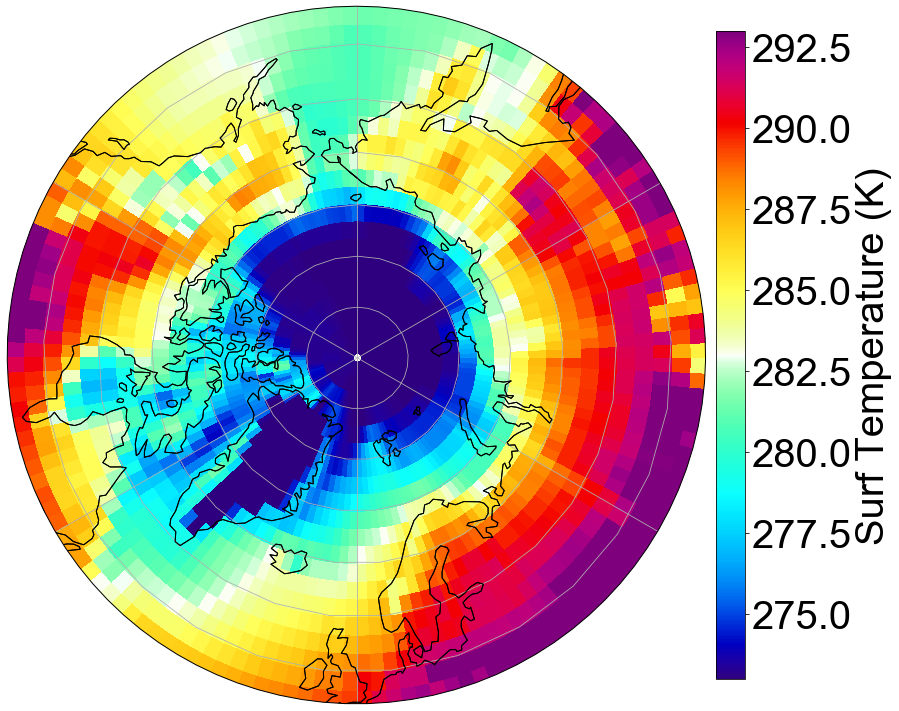

In [71]:
############################################################
#                         Figure 2
############################################################

fig = plt.figure(figsize=[10,10])
    
    

mon=7
vminmax = [273, 293]
levels = np.linspace(vminmax[0], vminmax[1], 50)

#============================================================
#    Plot   OMI   2005-2019 July mean
#============================================================
ax = define_map_1panel()

tmp = mm_Met_TS_05to19_Global
tmp = add_180_to_lon(tmp)
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.pcolormesh(vcd.lon, vcd.lat,\
            vcd.mean(dim='time'),\
            vmin=vminmax[0] , vmax=vminmax[1],\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
#             levels=levels,\
            cmap=cmaps.NCV_jaisnd
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()


#----------------------------------------------------------------------------------------------------------

fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.01)#调整子图间距
position=fig.add_axes([1, 0.05, 0.04, 0.9])
cb = fig.colorbar(im,cax=position,orientation='vertical')
cb.set_label('Surf Temperature (K)', fontsize=40)
cb.ax.tick_params(labelsize=40)
cb.ax.yaxis.get_offset_text().set_fontsize(30)

# Set the tick labels of the colorbar to use scientific notation
# cb.formatter = ScalarFormatter(useMathText=True)
# cb.formatter.set_powerlimits((0, 0))
# cb.update_ticks()

# plt.savefig('VCDs_pattern.svg')
# plt.savefig('VCDs_pattern.png',dpi=300,bbox_inches='tight')
plt.savefig('./fig_paper3_HCHOinterannual/FigS3.png',dpi=300,bbox_inches='tight')
plt.show()

<xarray.DataArray (time: 15)>
array([0., 1., 1., 0., 0., 1., 1., 0., 1., 1., 0., 1., 0., 0., 0.])
Coordinates:
  * time     (time) datetime64[ns] 2005-12-31 2006-12-31 ... 2019-12-31
East Europe  High HCHO years: [2006 2007 2010 2011 2013 2014 2016]
<xarray.DataArray (time: 15)>
array([0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 1., 1., 1., 1.])
Coordinates:
  * time     (time) datetime64[ns] 2005-12-31 2006-12-31 ... 2019-12-31
Siberia  High HCHO years: [2006 2012 2013 2014 2016 2017 2018 2019]
<xarray.DataArray (time: 15)>
array([0., 0., 0., 0., 0., 1., 0., 1., 1., 1., 1., 0., 1., 0., 0.])
Coordinates:
  * time     (time) datetime64[ns] 2005-12-31 2006-12-31 ... 2019-12-31
North Canada  High HCHO years: [2010 2012 2013 2014 2015 2017]
<xarray.DataArray (time: 15)>
array([1., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 1.])
Coordinates:
  * time     (time) datetime64[ns] 2005-12-31 2006-12-31 ... 2019-12-31
Alaska  High HCHO years: [2005 2009 2013 2015 2017 2019]


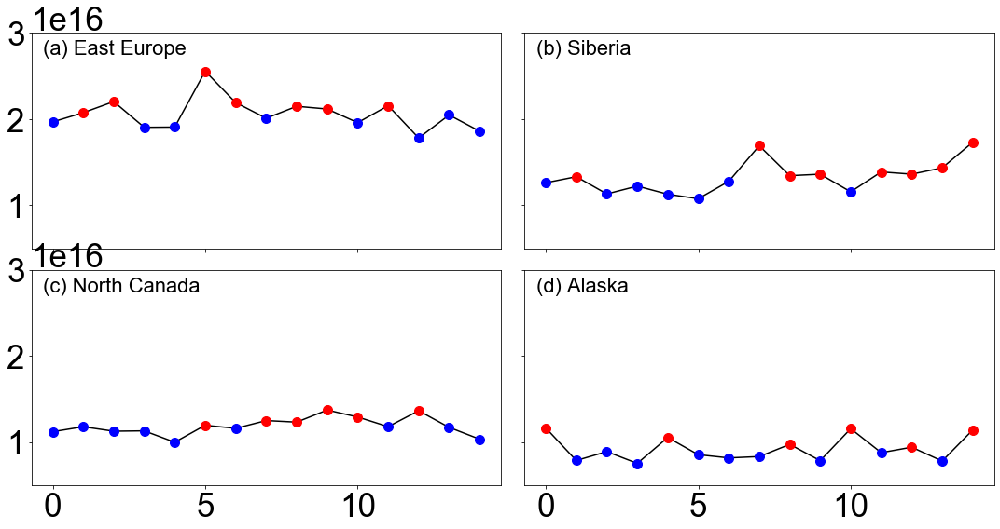

In [68]:
############################################################
#        Hign and Low HCHO years Selection
############################################################

Highyears_list = []
Lowyears_list = []

varlist = [
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU, \
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia, \
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA, \
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK, \
]

firelist = [
#     Emis_BioBurn_05to19_Global_summers_EastEU, \
#     Emis_BioBurn_05to19_Global_summers_Siberia, \
#     Emis_BioBurn_05to19_Global_summers_NA, \
#     Emis_BioBurn_05to19_Global_summers_AK, \
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU.resample(time='1Y').sum(dim='time'), \
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia.resample(time='1Y').sum(dim='time'), \
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA.resample(time='1Y').sum(dim='time'), \
    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK.resample(time='1Y').sum(dim='time'), \
]

titlelist = ['East Europe',"Siberia",'North Canada',"Alaska"]
titleindex = ["(a) East Europe","(b) Siberia","(c) North Canada","(d) Alaska"]

ipanel = 0
ipanelindex = [1,2,3,4]

fig = plt.figure(figsize=(15,8))
for ivar in firelist:
    
    ivcd = varlist[ipanel]
    vcd = ivcd.resample(time='1Y').sum(dim='time')
    
    vmin=0.5e16
    vmax=3e16
    cmap = mpl.cm.RdBu_r
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    


    ax = fig.add_subplot(2,2,ipanelindex[ipanel], aspect='auto')

    #-----------  Selection by K-Means ------------------#
    
#     from sklearn.cluster import KMeans
#     X = np.array([ vcd.values,\
#              np.zeros((vcd.shape))]).T
#     kmeans = KMeans(n_clusters=2, random_state=0).fit(X)
#     kmeans_index = kmeans.labels_
    
#     if vcd[np.where(kmeans_index==1)].mean() >= vcd[np.where(kmeans_index==0)].mean():
#         high_ind = 1
#         low_ind = 0
#     else:
#         high_ind = 0
#         low_ind = 1     
        
    #-----------  Selection by Above wildfire emission average ------------------#        

    # calculate yearly fire emission, averaged in 15 years
    ivar_mean = np.nanmean(ivar)
    # set an index array which is a copy of fire emis timeseries, then set higher year to 1, lower year to 0
    abovemean_index = ivar.copy()
    abovemean_index[abovemean_index>=ivar_mean]=1
    abovemean_index[abovemean_index!=1]=0
    low_ind = 0
    high_ind = 1
    
    print(abovemean_index)
        
    

    plt.plot(vcd, 'k')
    vcd_dummy = vcd.copy()
    vcd_dummy[np.where(abovemean_index==high_ind)] = np.nan
    plt.plot(vcd_dummy , 'o' , color='b', markersize=10)
    vcd_dummy = vcd.copy()
    vcd_dummy[np.where(abovemean_index==low_ind)] = np.nan
    plt.plot(vcd_dummy , 'o' , color='r', markersize=10)
#     print(titlelist[ipanel]+"  Low HCHO years: "+ str(vcd[np.where(kmeans_index==low_ind)].time.dt.year.values))
    print(titlelist[ipanel]+"  High HCHO years: "+ str(vcd[np.where(abovemean_index==high_ind)].time.dt.year.values))
    plt.ylim([vmin,vmax])
    
    Highyears_list.append( vcd[np.where(abovemean_index==high_ind)].time.dt.year.values )
    Lowyears_list.append( vcd[np.where(abovemean_index==low_ind)].time.dt.year.values )
    
    

#     plt.ylim([vmin,vmax])
    if ipanel in [0,1]:
        ax.set_xticklabels("")
    if ipanel in [1,3]:
        ax.set_yticklabels("")
        
        
#     plt.title(titlelist[ipanel])
    ax.annotate(titleindex[ipanel], xy=(0.025, 0.90), xycoords="axes fraction",fontsize=22, fontweight='bold')
    ipanel+=1

fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.1)#调整子图间距
# ax.legend(('GC','OMI reprocess','OMPS reprocess'),  loc="upper right", fontsize=16)
# ax2.legend(('SIF',''), fontsize=16)
# plt.savefig(outdir+'GCHiR_AK_18.png',dpi=300)




In [132]:
############################################################
#        Calculation  of HCHO VCD over 4 domains 
#                     for high and low years
############################################################

[Highyears_EastEU, Highyears_Siberia, Highyears_NA, Highyears_AK] = Highyears_list
[Lowyears_EastEU, Lowyears_Siberia, Lowyears_NA, Lowyears_AK] = Lowyears_list

#============================================================
#   GC VCD values
#============================================================
tmp01 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU, Highyears_EastEU ).mean().values)
tmp02 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia, Highyears_Siberia ).mean().values)
tmp03 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA, Highyears_NA ).mean().values)
tmp04 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK, Highyears_AK ).mean().values)

#============================================================
#    OMI 
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU, Highyears_EastEU ).mean().values)
print(  "OMI VCD,   Eastern Europe,  High years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")"  )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia, Highyears_Siberia ).mean().values)
print(  "OMI VCD,   Siberia,         High years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA, Highyears_NA ).mean().values)
print(  "OMI VCD,   North Canada,    High years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK, Highyears_AK ).mean().values)
print(  "OMI VCD,   Alaska,          High years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )


print("")

#============================================================
#    OMPS
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU, Highyears_EastEU ).mean().values)
print(  "OMPS VCD,  Eastern Europe,  High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia, Highyears_Siberia ).mean().values)
print(  "OMPS VCD,  Siberia,         High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA, Highyears_NA ).mean().values)
print(  "OMPS VCD,  North Canada,    High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK, Highyears_AK ).mean().values)
print(  "OMPS VCD,  Alaska,          High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )

print("")

#============================================================
#   GC VCD
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU, Highyears_EastEU ).mean().values)
print(  "GC VCD,  Eastern Europe,  High years:  " + format(tmp, '.1e') )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia, Highyears_Siberia ).mean().values)
print(  "GC VCD,  Siberia,         High years:  " + format(tmp, '.1e') )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA, Highyears_NA ).mean().values)
print(  "GC VCD,  North Canada,    High years:  " + format(tmp, '.1e') )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK, Highyears_AK ).mean().values)
print(  "GC VCD,  Alaska,          High years:  " + format(tmp, '.1e') )


print("")

#============================================================
#   GC VCD0
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU, Highyears_EastEU ).mean().values)
print(  "GC VCD0,  Eastern Europe,  High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia, Highyears_Siberia ).mean().values)
print(  "GC VCD0,  Siberia,         High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA, Highyears_NA ).mean().values)
print(  "GC VCD0,  North Canada,    High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK, Highyears_AK ).mean().values)
print(  "GC VCD0,  Alaska,          High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )


print("")

#============================================================
#   GC dVCD_Bio
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU, Highyears_EastEU ).mean().values)
print(  "GC dVCD_Bio,  Eastern Europe,  High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia, Highyears_Siberia ).mean().values)
print(  "GC dVCD_Bio,  Siberia,         High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA, Highyears_NA ).mean().values)
print(  "GC dVCD_Bio,  North Canada,    High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK, Highyears_AK ).mean().values)
print(  "GC dVCD_Bio,  Alaska,          High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )


print("")

#============================================================
#   GC dVCD_Fire
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU, Highyears_EastEU ).mean().values)
print(  "GC dVCD_Fire,  Eastern Europe,  High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia, Highyears_Siberia ).mean().values)
print(  "GC dVCD_Fire,  Siberia,         High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA, Highyears_NA ).mean().values)
print(  "GC dVCD_Fire,  North Canada,    High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK, Highyears_AK ).mean().values)
print(  "GC dVCD_Fire,  Alaska,          High years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )

OMI VCD,   Eastern Europe,  High years:  8.1e+15 (119.6%)
OMI VCD,   Siberia,         High years:  7.6e+15 (140.5%)
OMI VCD,   North Canada,    High years:  5.9e+15 (143.1%)
OMI VCD,   Alaska,          High years:  6.2e+15 (163.3%)

OMPS VCD,  Eastern Europe,  High years:  7.3e+15 (108.8%)
OMPS VCD,  Siberia,         High years:  7.2e+15 (133.0%)
OMPS VCD,  North Canada,    High years:  4.9e+15 (118.6%)
OMPS VCD,  Alaska,          High years:  4.1e+15 (107.7%)

GC VCD,  Eastern Europe,  High years:  6.7e+15
GC VCD,  Siberia,         High years:  5.4e+15
GC VCD,  North Canada,    High years:  4.1e+15
GC VCD,  Alaska,          High years:  3.8e+15

GC VCD0,  Eastern Europe,  High years:  4.2e+15 (62.0%)
GC VCD0,  Siberia,         High years:  2.7e+15 (50.8%)
GC VCD0,  North Canada,    High years:  2.5e+15 (60.3%)
GC VCD0,  Alaska,          High years:  2.2e+15 (57.7%)

GC dVCD_Bio,  Eastern Europe,  High years:  2.5e+15 (36.8%)
GC dVCD_Bio,  Siberia,         High years:  1.0e+15 (18.9%)


In [114]:
############################################################
#        Calculation  of HCHO VCD over 4 domains 
#                     for high and low years
############################################################

[Lowyears_EastEU, Lowyears_Siberia, Lowyears_NA, Lowyears_AK] = Lowyears_list
[Lowyears_EastEU, Lowyears_Siberia, Lowyears_NA, Lowyears_AK] = Lowyears_list

#============================================================
#   GC VCD values
#============================================================
tmp01 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU, Lowyears_EastEU ).mean().values)
tmp02 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia, Lowyears_Siberia ).mean().values)
tmp03 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA, Lowyears_NA ).mean().values)
tmp04 = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK, Lowyears_AK ).mean().values)

#============================================================
#    OMI 
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU, Lowyears_EastEU ).mean().values)
print(  "OMI VCD,   Eastern Europe,  Low years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia, Lowyears_Siberia ).mean().values)
print(  "OMI VCD,   Siberia,         Low years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA, Lowyears_NA ).mean().values)
print(  "OMI VCD,   North Canada,    Low years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK, Lowyears_AK ).mean().values)
print(  "OMI VCD,   Alaska,          Low years:  " + format(tmp, '.1e')  +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )


print("")

#============================================================
#    OMPS
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU, Lowyears_EastEU ).mean().values)
print(  "OMPS VCD,  Eastern Europe,  Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia, Lowyears_Siberia ).mean().values)
print(  "OMPS VCD,  Siberia,         Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA, Lowyears_NA ).mean().values)
print(  "OMPS VCD,  North Canada,    Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK, Lowyears_AK ).mean().values)
print(  "OMPS VCD,  Alaska,          Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )

print("")

#============================================================
#   GC VCD
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU, Lowyears_EastEU ).mean().values)
print(  "GC VCD,  Eastern Europe,  Low years:  " + format(tmp, '.1e') )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia, Lowyears_Siberia ).mean().values)
print(  "GC VCD,  Siberia,         Low years:  " + format(tmp, '.1e') )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA, Lowyears_NA ).mean().values)
print(  "GC VCD,  North Canada,    Low years:  " + format(tmp, '.1e') )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK, Lowyears_AK ).mean().values)
print(  "GC VCD,  Alaska,          Low years:  " + format(tmp, '.1e') )


print("")

#============================================================
#   GC VCD0
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU, Lowyears_EastEU ).mean().values)
print(  "GC VCD0,  Eastern Europe,  Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia, Lowyears_Siberia ).mean().values)
print(  "GC VCD0,  Siberia,         Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA, Lowyears_NA ).mean().values)
print(  "GC VCD0,  North Canada,    Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK, Lowyears_AK ).mean().values)
print(  "GC VCD0,  Alaska,          Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )


print("")

#============================================================
#   GC dVCD_Bio
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU, Lowyears_EastEU ).mean().values)
print(  "GC dVCD_Bio,  Eastern Europe,  Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia, Lowyears_Siberia ).mean().values)
print(  "GC dVCD_Bio,  Siberia,         Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA, Lowyears_NA ).mean().values)
print(  "GC dVCD_Bio,  North Canada,    Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK, Lowyears_AK ).mean().values)
print(  "GC dVCD_Bio,  Alaska,          Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )


print("")

#============================================================
#   GC dVCD_Fire
#============================================================
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU, Lowyears_EastEU ).mean().values)
print(  "GC dVCD_Fire,  Eastern Europe,  Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp01 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia, Lowyears_Siberia ).mean().values)
print(  "GC dVCD_Fire,  Siberia,         Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp02 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA, Lowyears_NA ).mean().values)
print(  "GC dVCD_Fire,  North Canada,    Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp03 * 100, '.1f')+"%"  +")" )
tmp = float(sel_July_in_yearlist(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK, Lowyears_AK ).mean().values)
print(  "GC dVCD_Fire,  Alaska,          Low years:  " + format(tmp, '.1e') +" ("+ format(tmp / tmp04 * 100, '.1f')+"%"  +")" )

OMI VCD,   Eastern Europe,  Low years:  6.9e+15 (121.7%)
OMI VCD,   Siberia,         Low years:  5.5e+15 (134.3%)
OMI VCD,   North Canada,    Low years:  5.0e+15 (141.1%)
OMI VCD,   Alaska,          Low years:  4.0e+15 (163.4%)

OMPS VCD,  Eastern Europe,  Low years:  6.3e+15 (110.9%)
OMPS VCD,  Siberia,         Low years:  4.5e+15 (111.2%)
OMPS VCD,  North Canada,    Low years:  3.4e+15 (98.0%)
OMPS VCD,  Alaska,          Low years:  2.0e+15 (81.1%)

GC VCD,  Eastern Europe,  Low years:  5.7e+15
GC VCD,  Siberia,         Low years:  4.1e+15
GC VCD,  North Canada,    Low years:  3.5e+15
GC VCD,  Alaska,          Low years:  2.4e+15

GC VCD0,  Eastern Europe,  Low years:  3.8e+15 (67.2%)
GC VCD0,  Siberia,         Low years:  2.7e+15 (66.0%)
GC VCD0,  North Canada,    Low years:  2.4e+15 (69.4%)
GC VCD0,  Alaska,          Low years:  2.1e+15 (86.5%)

GC dVCD_Bio,  Eastern Europe,  Low years:  1.8e+15 (32.6%)
GC dVCD_Bio,  Siberia,         Low years:  1.1e+15 (26.6%)
GC dVCD_Bio,  North 

In [378]:
#============================================================
#    OMI 
#============================================================

tmp = float( calculate_cv(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU ,  mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU) )
print(  "OMI VCD,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia ,  mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia) )
print(  "OMI VCD,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA ,  mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA) )
print(  "OMI VCD,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK ,  mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK) )
print(  "OMI VCD,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

print("")


#============================================================
#    OMPS
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU ,  mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU) )
print(  "OMPS VCD,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia ,  mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia) )
print(  "OMPS VCD,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA ,  mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA) )
print(  "OMPS VCD,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK ,  mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK) )
print(  "OMPS VCD,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

print("")

#============================================================
#   GC VCD
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU ) )
print(  "GC VCD,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia ) )
print(  "GC VCD,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA ) )
print(  "GC VCD,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK ) )
print(  "GC VCD,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

print("")

#============================================================
#   GC VCD0
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU) )
print(  "GC VCD0,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia) )
print(  "GC VCD0,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA) )
print(  "GC VCD0,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK) )
print(  "GC VCD0,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )


print("")

#============================================================
#   GC dVCD_Bio
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU) )
print(  "GC dVCD_Bio,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia) )
print(  "GC dVCD_Bio,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA) )
print(  "GC dVCD_Bio,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK) )
print(  "GC dVCD_Bio,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

print("")

#============================================================
#   GC dVCD_Fire
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU) )
print(  "GC dVCD_Fire,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia) )
print(  "GC dVCD_Fire,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA) )
print(  "GC dVCD_Fire,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK) )
print(  "GC dVCD_Fire,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )




OMI VCD,   Eastern Europe,  CV:  10.6%
OMI VCD,   Siberia,         CV:  14.1%
OMI VCD,   North Canada,    CV:  10.4%
OMI VCD,   Alaska,          CV:  16.5%

OMPS VCD,   Eastern Europe,  CV:  10.0%
OMPS VCD,   Siberia,         CV:  17.9%
OMPS VCD,   North Canada,    CV:  15.8%
OMPS VCD,   Alaska,          CV:  32.4%

GC VCD,   Eastern Europe,  CV:  8.8%
GC VCD,   Siberia,         CV:  13.8%
GC VCD,   North Canada,    CV:  8.5%
GC VCD,   Alaska,          CV:  15.2%

GC VCD0,   Eastern Europe,  CV:  3.9%
GC VCD0,   Siberia,         CV:  2.3%
GC VCD0,   North Canada,    CV:  3.5%
GC VCD0,   Alaska,          CV:  3.3%

GC dVCD_Bio,   Eastern Europe,  CV:  4.5%
GC dVCD_Bio,   Siberia,         CV:  1.6%
GC dVCD_Bio,   North Canada,    CV:  2.1%
GC dVCD_Bio,   Alaska,          CV:  1.7%

GC dVCD_Fire,   Eastern Europe,  CV:  1.6%
GC dVCD_Fire,   Siberia,         CV:  12.4%
GC dVCD_Fire,   North Canada,    CV:  7.9%
GC dVCD_Fire,   Alaska,          CV:  13.2%


In [143]:
#============================================================
#    OMI 
#============================================================

tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU ) )
print(  "OMI VCD,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia ) )
print(  "OMI VCD,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA ) )
print(  "OMI VCD,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK ) )
print(  "OMI VCD,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )

print("")


#============================================================
#    OMPS
#============================================================
tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU ) )
print(  "OMPS VCD,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia ) )
print(  "OMPS VCD,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA ) )
print(  "OMPS VCD,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK ) )
print(  "OMPS VCD,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )

print("")

#============================================================
#   GC VCD
#============================================================
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU ) )
print(  "GC VCD,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia ) )
print(  "GC VCD,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA ) )
print(  "GC VCD,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK ) )
print(  "GC VCD,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )

print("")

#============================================================
#   GC VCD0
#============================================================
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU ) )
print(  "GC VCD0,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia ) )
print(  "GC VCD0,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA ) )
print(  "GC VCD0,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK ) )
print(  "GC VCD0,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )


print("")

#============================================================
#   GC dVCD_Bio
#============================================================
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU ) )
print(  "GC dVCD_Bio,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia ) )
print(  "GC dVCD_Bio,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA ) )
print(  "GC dVCD_Bio,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK ) )
print(  "GC dVCD_Bio,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )

print("")

#============================================================
#   GC dVCD_Fire
#============================================================
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU ) )
print(  "GC dVCD_Fire,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia ) )
print(  "GC dVCD_Fire,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA ) )
print(  "GC dVCD_Fire,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK ) )
print(  "GC dVCD_Fire,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )
print("")




#============================================================
#   GC Isoprene emission
#============================================================
tmp = float( calculate_yearly_trend(mm_EmisISOP_Total_05to19_Global_AllPFT_EastEU ) )
print(  "GC ISOPe,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_EmisISOP_Total_05to19_Global_AllPFT_Siberia ) )
print(  "GC ISOPe,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_EmisISOP_Total_05to19_Global_AllPFT_NA ) )
print(  "GC ISOPe,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_EmisISOP_Total_05to19_Global_AllPFT_AK ) )
print(  "GC ISOPe,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )
print("")


#============================================================
#   GC Monoterpenes emission
#============================================================
tmp = float( calculate_yearly_trend(mm_EmisMTPA_Total_05to19_Global_AllPFT_EastEU ) )
print(  "GC MONOe,   Eastern Europe,  Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_EmisMTPA_Total_05to19_Global_AllPFT_Siberia ) )
print(  "GC MONOe,   Siberia,         Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_EmisMTPA_Total_05to19_Global_AllPFT_NA ) )
print(  "GC MONOe,   North Canada,    Trend:  " + format(tmp, '.1f') + "%"   )
tmp = float( calculate_yearly_trend(mm_EmisMTPA_Total_05to19_Global_AllPFT_AK ) )
print(  "GC MONOe,   Alaska,          Trend:  " + format(tmp, '.1f') + "%"   )



OMI VCD,   Eastern Europe,  Trend:  -0.6%
OMI VCD,   Siberia,         Trend:  1.7%
OMI VCD,   North Canada,    Trend:  1.3%
OMI VCD,   Alaska,          Trend:  0.5%

OMPS VCD,   Eastern Europe,  Trend:  -2.5%
OMPS VCD,   Siberia,         Trend:  -1.3%
OMPS VCD,   North Canada,    Trend:  -2.5%
OMPS VCD,   Alaska,          Trend:  1.4%

GC VCD,   Eastern Europe,  Trend:  -0.5%
GC VCD,   Siberia,         Trend:  1.7%
GC VCD,   North Canada,    Trend:  0.6%
GC VCD,   Alaska,          Trend:  0.3%

GC VCD0,   Eastern Europe,  Trend:  -0.1%
GC VCD0,   Siberia,         Trend:  0.0%
GC VCD0,   North Canada,    Trend:  -0.3%
GC VCD0,   Alaska,          Trend:  0.1%

GC dVCD_Bio,   Eastern Europe,  Trend:  -0.4%
GC dVCD_Bio,   Siberia,         Trend:  -0.7%
GC dVCD_Bio,   North Canada,    Trend:  -1.1%
GC dVCD_Bio,   Alaska,          Trend:  -1.1%

GC dVCD_Fire,   Eastern Europe,  Trend:  -23.6%
GC dVCD_Fire,   Siberia,         Trend:  12.2%
GC dVCD_Fire,   North Canada,    Trend:  9.5%
GC dVCD

In [253]:
import pymannkendall as mk

#============================================================
#    OMI 
#============================================================

tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU )
print(  "OMI VCD,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia )
print(  "OMI VCD,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA )
print(  "OMI VCD,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK )
print(  "OMI VCD,   Alaska,          Trend MK p value:  " + tmp[0]    )

print("")


#============================================================
#    OMPS
#============================================================
tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU )
print(  "OMPS VCD,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia )
print(  "OMPS VCD,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA )
print(  "OMPS VCD,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK )
print(  "OMPS VCD,   Alaska,          Trend MK p value:  " + tmp[0]    )

print("")

#============================================================
#   GC VCD
#============================================================
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU )
print(  "GC VCD,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia )
print(  "GC VCD,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA )
print(  "GC VCD,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK )
print(  "GC VCD,   Alaska,          Trend MK p value:  " + tmp[0]    )

print("")

#============================================================
#   GC VCD0
#============================================================
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU )
print(  "GC VCD0,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia )
print(  "GC VCD0,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA )
print(  "GC VCD0,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK )
print(  "GC VCD0,   Alaska,          Trend MK p value:  " + tmp[0]    )


print("")

#============================================================
#   GC dVCD_Bio
#============================================================
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU )
print(  "GC dVCD_Bio,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia )
print(  "GC dVCD_Bio,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA )
print(  "GC dVCD_Bio,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK )
print(  "GC dVCD_Bio,   Alaska,          Trend MK p value:  " + tmp[0]    )

print("")

#============================================================
#   GC dVCD_Fire
#============================================================
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU )
print(  "GC dVCD_Fire,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia )
print(  "GC dVCD_Fire,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA )
print(  "GC dVCD_Fire,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK )
print(  "GC dVCD_Fire,   Alaska,          Trend MK p value:  " + tmp[0]    )
print("")

#============================================================
#   GC Fire emission
#============================================================
tmp0 = xr.DataArray( (Emis_BioBurn_05to19_Global_summers_EastEU / sum_gridarea_EastEU), coords=[mm_EmisISOP_Total_05to19_Global_AllPFT_AK.resample(time='1Y').mean(dim='time').time], dims=['time'] )
tmp =  perform_mann_kendall_test( tmp0 )
print(  "GC fire emission,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp0 = xr.DataArray( (Emis_BioBurn_05to19_Global_summers_Siberia / sum_gridarea_Siberia), coords=[mm_EmisISOP_Total_05to19_Global_AllPFT_AK.resample(time='1Y').mean(dim='time').time], dims=['time'] )
tmp =  perform_mann_kendall_test( tmp0 )
print(  "GC fire emission,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp0 = xr.DataArray( (Emis_BioBurn_05to19_Global_summers_NA / sum_gridarea_NA), coords=[mm_EmisISOP_Total_05to19_Global_AllPFT_AK.resample(time='1Y').mean(dim='time').time], dims=['time'] )
tmp =  perform_mann_kendall_test( tmp0 )
print(  "GC fire emission,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp0 = xr.DataArray( (Emis_BioBurn_05to19_Global_summers_AK / sum_gridarea_AK), coords=[mm_EmisISOP_Total_05to19_Global_AllPFT_AK.resample(time='1Y').mean(dim='time').time], dims=['time'] )
tmp =  perform_mann_kendall_test( tmp0 )
print(  "GC fire emission,   Alaska,          Trend MK p value:  " + tmp[0]    )
print("")


#============================================================
#   GC Isoprene emission
#============================================================
tmp =  perform_mann_kendall_test(mm_EmisISOP_Total_05to19_Global_AllPFT_EastEU )
print(  "GC ISOPe,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_EmisISOP_Total_05to19_Global_AllPFT_Siberia )
print(  "GC ISOPe,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_EmisISOP_Total_05to19_Global_AllPFT_NA )
print(  "GC ISOPe,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_EmisISOP_Total_05to19_Global_AllPFT_AK )
print(  "GC ISOPe,   Alaska,          Trend MK p value:  " + tmp[0]    )
print("")


#============================================================
#   GC Monoterpenes emission
#============================================================
tmp =  perform_mann_kendall_test(mm_EmisMTPA_Total_05to19_Global_AllPFT_EastEU )
print(  "GC MONOe,   Eastern Europe,  Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_EmisMTPA_Total_05to19_Global_AllPFT_Siberia )
print(  "GC MONOe,   Siberia,         Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_EmisMTPA_Total_05to19_Global_AllPFT_NA )
print(  "GC MONOe,   North Canada,    Trend MK p value:  " + tmp[0]    )
tmp =  perform_mann_kendall_test(mm_EmisMTPA_Total_05to19_Global_AllPFT_AK )
print(  "GC MONOe,   Alaska,          Trend MK p value:  " + tmp[0]    )



OMI VCD,   Eastern Europe,  Trend MK p value:  no trend
OMI VCD,   Siberia,         Trend MK p value:  no trend
OMI VCD,   North Canada,    Trend MK p value:  increasing
OMI VCD,   Alaska,          Trend MK p value:  no trend

OMPS VCD,   Eastern Europe,  Trend MK p value:  no trend
OMPS VCD,   Siberia,         Trend MK p value:  no trend
OMPS VCD,   North Canada,    Trend MK p value:  no trend
OMPS VCD,   Alaska,          Trend MK p value:  no trend

GC VCD,   Eastern Europe,  Trend MK p value:  no trend
GC VCD,   Siberia,         Trend MK p value:  increasing
GC VCD,   North Canada,    Trend MK p value:  no trend
GC VCD,   Alaska,          Trend MK p value:  no trend

GC VCD0,   Eastern Europe,  Trend MK p value:  no trend
GC VCD0,   Siberia,         Trend MK p value:  no trend
GC VCD0,   North Canada,    Trend MK p value:  no trend
GC VCD0,   Alaska,          Trend MK p value:  no trend

GC dVCD_Bio,   Eastern Europe,  Trend MK p value:  no trend
GC dVCD_Bio,   Siberia,         Tren

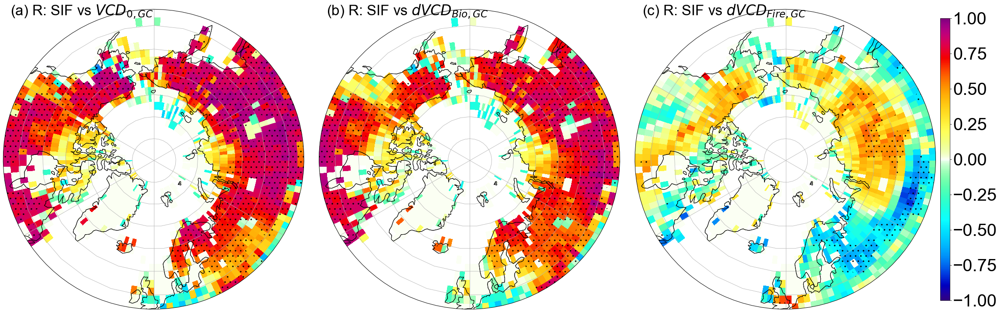

In [70]:
############################################################
#                         Figure 5
#        Correlation between   SIF   and    GC dVCDs
############################################################

varpair_list = [
    [mm_sif_ann_15to19_2x25, (mm_HCHOVCD_GC_05to19_Boff_NoWF_Global)],\
    [mm_sif_ann_15to19_2x25, (mm_HCHOVCD_GC_05to19_NoWF_Global - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global)],\
    [mm_sif_ann_15to19_2x25, (mm_HCHOVCD_GC_05to19_WF_Global - mm_HCHOVCD_GC_05to19_NoWF_Global)],\
]    
# varpair_list = [
#     [mm_GOSIF_05to19_2x25.resample(time='1Y').mean(dim='time'), (mm_HCHOVCD_GC_05to19_Boff_NoWF_Global).resample(time='1Y').mean(dim='time')],\
#     [mm_GOSIF_05to19_2x25.resample(time='1Y').mean(dim='time'), (mm_HCHOVCD_GC_05to19_NoWF_Global - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global).resample(time='1Y').mean(dim='time')],\
#     [mm_GOSIF_05to19_2x25.resample(time='1Y').mean(dim='time'), (mm_HCHOVCD_GC_05to19_WF_Global - mm_HCHOVCD_GC_05to19_NoWF_Global).resample(time='1Y').mean(dim='time')],\
# ]
titlelist = ["(a) R: SIF vs $VCD_{0,GC}$","(b) R: SIF vs $dVCD_{Bio,GC}$","(c) R: SIF vs $dVCD_{Fire,GC}$"]

fig = plt.figure(figsize=[30,10])

vminmax = [-1,1]
levels = np.linspace(vminmax[0], vminmax[1], 50)

for ipanel in range(0,3):

    ax = define_map_3panels(ipanel+1)

    tmp_sif, tmp_hcho = xr.align( varpair_list[ipanel][0] , varpair_list[ipanel][1] , join='inner'  )
    tmp_sif = tmp_sif.fillna(value=999)
    tmp_hcho = tmp_hcho.fillna(value=999)
    r,p = rum.utilities.dataarray_pearsonr(tmp_sif,tmp_hcho)
    p[p==0]=np.nan
    
    im=ax.pcolormesh(tmp_sif.lon, tmp_sif.lat,\
                r,\
                vmin=vminmax[0] , vmax=vminmax[1],\
                transform=ccrs.PlateCarree(),\
                cmap=cmaps.NCV_jaisnd,\
                     )
    
    ax.contourf(tmp_sif.lon, tmp_sif.lat,\
                p,\
                colors='none',\
                levels=[0,0.05],\
                vmin=0 , vmax=0.05,\
                transform=ccrs.PlateCarree(),\
                zorder=3,\
                hatches=".")
    
    ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
    ax.coastlines(zorder=3)
    ax.gridlines()
    ax.annotate(titlelist[ipanel], xy=(0.025, 0.98), xycoords="axes fraction",fontsize=33, fontweight='bold')

    # plot_region()



fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.01)#调整子图间距
position=fig.add_axes([1, 0.05, 0.01, 0.9])
cb = fig.colorbar(im,cax=position,orientation='vertical')
cb.ax.tick_params(labelsize=40)
# cb.ax.yaxis.get_offset_text().set_fontsize(40)



# plt.savefig('R__SIF_dVCDs.svg')
# plt.savefig('R__SIF_dVCDs.png',dpi=300,bbox_inches='tight')
plt.savefig('./fig_paper3_HCHOinterannual/FigS2.png',dpi=300,bbox_inches='tight')
plt.show()

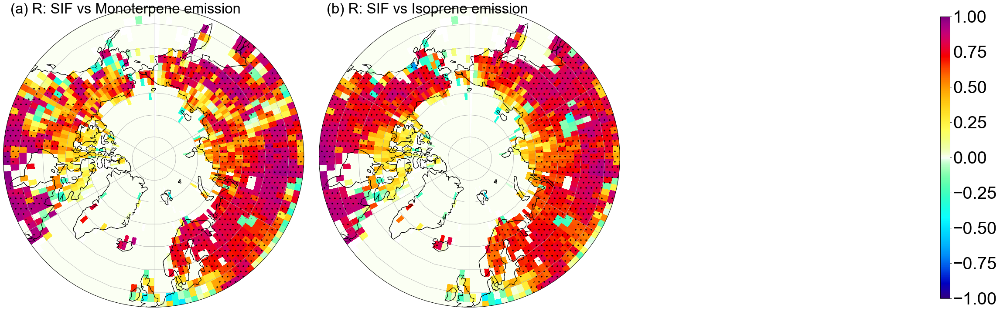

In [585]:
############################################################
#                         Figure 5
#        Correlation between   SIF   and    GC dVCDs
############################################################

varpair_list = [
    [mm_sif_ann_15to19_2x25, (mm_EmisMTPA_Total_05to19_Global)],\
    [mm_sif_ann_15to19_2x25, (mm_EmisISOP_Total_05to19_Global)],\
]    
# varpair_list = [
#     [mm_GOSIF_05to19_2x25.resample(time='1Y').mean(dim='time'), (mm_HCHOVCD_GC_05to19_Boff_NoWF_Global).resample(time='1Y').mean(dim='time')],\
#     [mm_GOSIF_05to19_2x25.resample(time='1Y').mean(dim='time'), (mm_HCHOVCD_GC_05to19_NoWF_Global - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global).resample(time='1Y').mean(dim='time')],\
#     [mm_GOSIF_05to19_2x25.resample(time='1Y').mean(dim='time'), (mm_HCHOVCD_GC_05to19_WF_Global - mm_HCHOVCD_GC_05to19_NoWF_Global).resample(time='1Y').mean(dim='time')],\
# ]
titlelist = ["(a) R: SIF vs Monoterpene emission","(b) R: SIF vs Isoprene emission"]

fig = plt.figure(figsize=[30,10])

vminmax = [-1,1]
levels = np.linspace(vminmax[0], vminmax[1], 50)

for ipanel in range(0,2):

    ax = define_map_3panels(ipanel+1)

    tmp_sif, tmp_hcho = xr.align( varpair_list[ipanel][0] , varpair_list[ipanel][1] , join='inner'  )
    tmp_sif = tmp_sif.fillna(value=999)
    tmp_hcho = tmp_hcho.fillna(value=999)
    r,p = rum.utilities.dataarray_pearsonr(tmp_sif,tmp_hcho)
    p[p==0]=np.nan
    
    im=ax.pcolormesh(tmp_sif.lon, tmp_sif.lat,\
                r,\
                vmin=vminmax[0] , vmax=vminmax[1],\
                transform=ccrs.PlateCarree(),\
                cmap=cmaps.NCV_jaisnd,\
                     )
    
    ax.contourf(tmp_sif.lon, tmp_sif.lat,\
                p,\
                colors='none',\
                levels=[0,0.05],\
                vmin=0 , vmax=0.05,\
                transform=ccrs.PlateCarree(),\
                zorder=3,\
                hatches=".")
    
    ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
    ax.coastlines(zorder=3)
    ax.gridlines()
    ax.annotate(titlelist[ipanel], xy=(0.025, 0.98), xycoords="axes fraction",fontsize=33, fontweight='bold')

    # plot_region()



fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.01)#调整子图间距
position=fig.add_axes([1, 0.05, 0.01, 0.9])
cb = fig.colorbar(im,cax=position,orientation='vertical')
cb.ax.tick_params(labelsize=40)
# cb.ax.yaxis.get_offset_text().set_fontsize(40)



# plt.savefig('R__SIF_dVCDs.svg')
# plt.savefig('R__SIF_dVCDs.png',dpi=300,bbox_inches='tight')

plt.show()

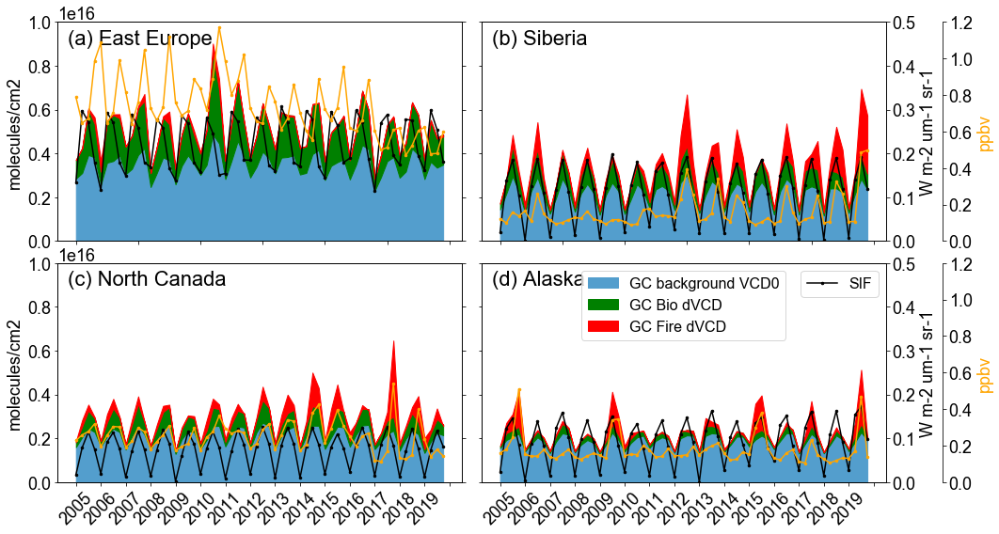

In [45]:
############################################################
#                         Figure 3X,  Temp->NOx
############################################################


varlist = [
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU,   mm_GOSIF_05to19_2x25_AllPFT_EastEU,  mm_SpeciesConc_NOx_05to19_Global_AllPFT_EastEU ],\
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia,   mm_GOSIF_05to19_2x25_AllPFT_Siberia,  mm_SpeciesConc_NOx_05to19_Global_AllPFT_Siberia ],\
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA,   mm_GOSIF_05to19_2x25_AllPFT_NA,  mm_SpeciesConc_NOx_05to19_Global_AllPFT_NA ],\
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK,   mm_GOSIF_05to19_2x25_AllPFT_AK,  mm_SpeciesConc_NOx_05to19_Global_AllPFT_AK ],\
]


titlelist = ['East Europe',"Siberia",'North Canada',"Alaska"]
titleindex = ["(a) East Europe","(b) Siberia","(c) North Canada","(d) Alaska"]

ipanel = 0
ipanelindex = [1,2,3,4]

fig = plt.figure(figsize=(15,8))
for ivar in varlist: 
    
    vmin=0
    vmax=1e16
    cmap = mpl.cm.RdBu_r
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    


    ax = fig.add_subplot(2,2,ipanelindex[ipanel], aspect='auto')

    x = np.arange( 0,len(ivar[0]) )
    
    # Select some data to plot
    ##############      GC       ###########################
#     ax.plot( x , ivar[0].values, '-', color='#539ecd')
    ax.fill_between(x , ivar[0].values, color='#539ecd')
#     ax.plot( x , ivar[1].values, '-', color='green')
    ax.fill_between(x, ivar[0].values, ivar[1].values, color='green')
#     ax.plot( x , ivar[2].values, '-', color='red')
    ax.fill_between(x , ivar[1].values, ivar[2].values, color='red')
    ##############        OMI      #####################
#     ax.plot(x, ivar[3].values, color='blue', marker='.')

    plt.ylim([vmin,vmax])
    if ipanel in [2,3]:
        ax.set_xticks( np.linspace(0,60,16) )
        ax.set_xticklabels(np.arange(2005,2020), rotation=45)    
    else:
        ax.set_xticklabels("")
    if ipanel in [1,3]:
        ax.set_yticklabels("")
    
    
    
    #################. SIF. ######################
    ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.plot(x, ivar[3].values , marker='.',markersize=5,color='k')

    plt.ylim([0,0.5])

        
        
    ################    NOx     ######################
    ax3 = ax.twinx()  # instantiate a second axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 60))
    ax3.plot(x, ivar[4].values * 1e9 , marker='.',markersize=5,color='orange')
    ax3.set_ylim([0,1.2])
    
    if ipanel in [0,2]:
        ax2.set_yticklabels("")
        ax3.set_yticklabels("")
        ax.set_ylabel("molecules/cm2")
    if ipanel in [1,3]:
        ax3.set_ylabel("ppbv", color='orange')
        ax2.set_ylabel("W m-2 um-1 sr-1")
    

        
        
#     plt.title(titlelist[ipanel])
    ax.annotate(titleindex[ipanel], xy=(0.025, 0.90), xycoords="axes fraction",fontsize=22, fontweight='bold')
    ipanel+=1

fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.1)#调整子图间距
ax.legend(('GC background VCD0','GC Bio dVCD','GC Fire dVCD'),  loc="upper center", fontsize=16)
ax2.legend(('SIF',''), fontsize=16)
# plt.savefig(outdir+'GCHiR_AK_18.png',dpi=300)








In [64]:
#####################   Define land  and regional masks   ###########################
# region_namelist = ["East Europe (50-71N, 20-50E)",\
#                    "Siberia (57-75N, 60-140E)",\
#                    "North Canada (50-75N, -130--40E)",\
#                   "Alaska (50-75N, -170--130E)"]

# region_latlonrange = [
#     [[50,71],[20,50]],\
#     [[57,75],[60,140]],\
#     [[50,75],[-130,-40]],\
#     [[50,75],[-170,-130]],\
# ]

region_namelist_6 = ["East Europe (50-71N, 20-50E)",\
                     "Siberia (57-75N, 60-140E)",\
                     "North Canada (50-75N, -130--40E)",\
                     "Alaska (50-75N, -170--130E)",\
                     "Southeast US (26-36N, -100--75E)",\
                     "Amazon (-20--5N, -75--40E)"]

region_latlonrange_6 = [
    [[50,71],[20,50]],\
    [[57,75],[60,140]],\
    [[50,75],[-130,-40]],\
    [[50,75],[-170,-130]],\
    [[26,36],[-100,-75]],\
    [[-20,-5],[-75,-40]],\
]

# Land mask

region_mask_list_GC_6 = rum.utilities.cal_region_mask(region_latlonrange_6, "AllPFT", "land", mm_HCHOVCD_GC_05to19_WF_Global)
region_mask_list_OMI_6 = rum.utilities.cal_region_mask(region_latlonrange_6, "AllPFT", "land", mm_HCHOVCD_OMI_05to19_Global_new)
region_mask_list_sif_6 = rum.utilities.cal_region_mask(region_latlonrange_6, "AllPFT", "land", mm_sif_ann_15to19_regridded)

In [65]:
#  linear regression for SIF vs dVCD over continental 4 regions.
#  binned scatter plot + regression
#  also SIF vs isoprene emission

import regionmask
land = regionmask.defined_regions.natural_earth.land_110


tmp_HCHO = (mm_HCHOVCD_GC_05to19_NoWF_Global - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global)
tmp_HCHO_land = tmp_HCHO.where(land.mask_3D(tmp_HCHO)).squeeze()
tmp_sif_land = mm_sif_ann_15to19_2x25.where(land.mask_3D(mm_sif_ann_15to19_2x25)).squeeze()
tmp_Met_TS_land = mm_Met_TS_05to19_Global.where(land.mask_3D(mm_Met_TS_05to19_Global)).squeeze()
tmp_EmisISOP_land = EmisISOP_Total_05to19_Global.where(land.mask_3D(EmisISOP_Total_05to19_Global)).squeeze()
tmp_EmisMTPA_land = EmisMTPA_Total_05to19_Global.where(land.mask_3D(EmisMTPA_Total_05to19_Global)).squeeze()

tmp_sif_land_domain_flatten_list = []
tmp_HCHO_land_domain_flatten_list = []
tmp_EmisISOP_land_domain_flatten_list = []
tmp_EmisMTPA_land_domain_flatten_list = []


for idomain in range(0, len(region_mask_list_GC_6)):

    tmp_HCHO_land_domain = tmp_HCHO_land * region_mask_list_GC_6[idomain,:,:]
    tmp_EmisISOP_land_domain = tmp_EmisISOP_land * region_mask_list_GC_6[idomain,:,:]
    tmp_EmisMTPA_land_domain = tmp_EmisMTPA_land * region_mask_list_GC_6[idomain,:,:]
    tmp_sif_land_domain = tmp_sif_land * region_mask_list_GC_6[idomain,:,:]
#     tmp_Met_TS_land_domain = tmp_Met_TS_land * region_mask_list_GC[idomain,:,:]
   

    # ----------------------------------------------
    tmp_sif_land_domain,tmp_HCHO_land_domain = xr.align( tmp_sif_land_domain , tmp_HCHO_land_domain , join='inner'  )
    tmp_sif_land_domain_flatten = tmp_sif_land_domain[:,:,:].values.flatten()
    tmp_sif_land_domain_flatten[tmp_sif_land_domain_flatten==0]=np.nan
    tmp_HCHO_land_domain_flatten = tmp_HCHO_land_domain[:,:,:].values.flatten()
    tmp_HCHO_land_domain_flatten[tmp_HCHO_land_domain_flatten==0]=np.nan
    
    tmp_sif_land_domain,tmp_EmisISOP_land_domain = xr.align( tmp_sif_land_domain , tmp_EmisISOP_land_domain , join='inner'  )
#     tmp_sif_land_domain_flatten = tmp_sif_land_domain[:,70:,:].values.flatten()
#     tmp_sif_land_domain_flatten[tmp_sif_land_domain_flatten==0]=np.nan
    tmp_EmisISOP_land_domain_flatten = tmp_EmisISOP_land_domain[:,:,:].values.flatten()
    tmp_EmisISOP_land_domain_flatten[tmp_EmisISOP_land_domain_flatten==0]=np.nan   

    tmp_sif_land_domain,tmp_EmisMTPA_land_domain = xr.align( tmp_sif_land_domain , tmp_EmisMTPA_land_domain , join='inner'  )
#     tmp_sif_land_domain_flatten = tmp_sif_land_domain[:,70:,:].values.flatten()
#     tmp_sif_land_domain_flatten[tmp_sif_land_domain_flatten==0]=np.nan
    tmp_EmisMTPA_land_domain_flatten = tmp_EmisMTPA_land_domain[:,:,:].values.flatten()
    tmp_EmisMTPA_land_domain_flatten[tmp_EmisMTPA_land_domain_flatten==0]=np.nan
    
    tmp_sif_land_domain_flatten_list.append( tmp_sif_land_domain_flatten )
    tmp_HCHO_land_domain_flatten_list.append( tmp_HCHO_land_domain_flatten )
    tmp_EmisISOP_land_domain_flatten_list.append( tmp_EmisISOP_land_domain_flatten )
    tmp_EmisMTPA_land_domain_flatten_list.append( tmp_EmisMTPA_land_domain_flatten )


1
2
3
4
5
6
7
8
9
10
11
12


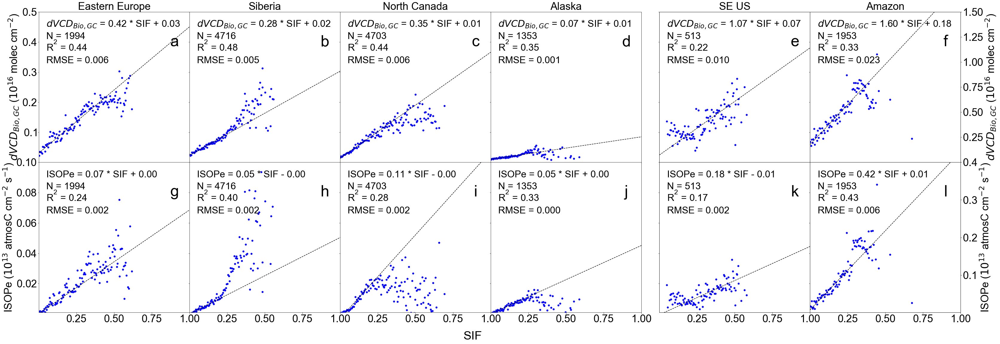

In [66]:
mpl.rcParams['font.sans-serif'] = "Arial"
mpl.rcParams['font.family'] = "sans-serif"
plt.rcParams['figure.figsize'] = (10, 6)
mpl.rc('xtick', labelsize=35) 
mpl.rc('ytick', labelsize=35)
plt.rcParams['axes.labelsize'] = 35
plt.rcParams['axes.titlesize'] = 35
fontnum=32


class LeftExponentFormatter(ticker.ScalarFormatter):
    def __call__(self, x, pos=None):
        if x == 0:
            return '0'
        exponent = int(np.log10(np.abs(x)))
        coeff = x / (10 ** exponent)
        return r"${:1.1f}\times10^{{{:2d}}}$".format(coeff, exponent)




xy_dummy = [ 
    ["SIF", "$dVCD_{Bio,GC}$"],\
    ["SIF", "ISOPe"]
]

SIF_HCHO_pairs_sitelist = [
    [tmp_sif_land_domain_flatten_list[0] , tmp_HCHO_land_domain_flatten_list[0]*1e-16],\
    [tmp_sif_land_domain_flatten_list[1] , tmp_HCHO_land_domain_flatten_list[1]*1e-16],\
    [tmp_sif_land_domain_flatten_list[2] , tmp_HCHO_land_domain_flatten_list[2]*1e-16],\
    [tmp_sif_land_domain_flatten_list[3] , tmp_HCHO_land_domain_flatten_list[3]*1e-16],\
    [tmp_sif_land_domain_flatten_list[4] , tmp_HCHO_land_domain_flatten_list[4]*1e-16],\
    [tmp_sif_land_domain_flatten_list[5] , tmp_HCHO_land_domain_flatten_list[5]*1e-16],\
]

SIF_EmisISOP_pairs_sitelist = [    
    [tmp_sif_land_domain_flatten_list[0] , convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(tmp_EmisISOP_land_domain_flatten_list[0]) ],\
    [tmp_sif_land_domain_flatten_list[1] , convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(tmp_EmisISOP_land_domain_flatten_list[1]) ],\
    [tmp_sif_land_domain_flatten_list[2] , convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(tmp_EmisISOP_land_domain_flatten_list[2]) ],\
    [tmp_sif_land_domain_flatten_list[3] , convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(tmp_EmisISOP_land_domain_flatten_list[3]) ],\
    [tmp_sif_land_domain_flatten_list[4] , convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(tmp_EmisISOP_land_domain_flatten_list[4]) ],\
    [tmp_sif_land_domain_flatten_list[5] , convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(tmp_EmisISOP_land_domain_flatten_list[5]) ],\
]

HCHO_lims = [0.001,0.5]
HCHO_lims_midlat = [0.001, 1.5]
EmisISOP_lims = [0.001,0.1]
EmisISOP_lims_midlat = [0.001, 0.4]
SIF_lims = [0.001,1]


sif_bin_num = np.arange(0,1,0.005)
hcho_bin_num = np.arange(0,2,0.005)
isope_bin_num = np.arange(0,0.2,0.0025)

titles = [
    "Eastern Europe","Siberia","North Canada","Alaska","SE US","Amazon",\
    "Eastern Europe","Siberia","North Canada","Alaska","SE US","Amazon"
#     "Eastern Europe","Siberia","SE US","Amazon"

]




bin_num = 300
addup_list = tmp_sif_land_domain_flatten_list



import numpy.ma as ma
import matplotlib.ticker as ticker

ncol = 6  # how many pairs (4 = 3 MODIS + 1 GC)
nraw = 2    # how many sites

fig = plt.figure(figsize=(7*ncol,7*nraw))

tmp_x = np.linspace(SIF_lims[0],SIF_lims[1],20)
tmp_fw = [-0.035 + 0.002, -0.035 + 0.24 , -0.035+ 0.24*2, -0.035+ 0.24*3]
tmp_fh = [0 - 0.12, 0 - 0.12, 0 - 0.12, 0 - 0.12]

tmp_fw = [-0.035 + 0.002, -0.035 + 0.24 , -0.035+ 0.24*2, -0.035+ 0.24*3]
tmp_fh = [0 - 0.12, 0 - 0.12, 0 - 0.12, 0 - 0.12]

# panel_label = ["a", "b","c", "d"]
panel_label = ["a", "b", "c", "d", "e", "f", "g", "h", "i", "j", "k", "l"]

svalue=30
    
ipanel = 1
ivar = 0



# Loop through the SIF_HCHO_pairs_sitelist and SIF_EmisISOP_pairs_sitelist lists
for pairs_sitelist, label, y_label in zip(
    [SIF_HCHO_pairs_sitelist, SIF_EmisISOP_pairs_sitelist],
    ["HCHO", "EmisISOP"],
    [r"$dVCD_{Bio,GC}$ ($10^{16}$ molec cm$^{-2}$)", r'ISOPe ($10^{13}$ atmosC cm$^{-2}$ s$^{-1}$)'],
):
    
    if label == "HCHO":
        bin_num = sif_bin_num
        y_lims = HCHO_lims
        y_lims2 = HCHO_lims_midlat
        iflag_dummy = 0
    elif label == "EmisISOP":
        bin_num = sif_bin_num
        y_lims = EmisISOP_lims
        y_lims2 = EmisISOP_lims_midlat
        iflag_dummy = 1


#     for _ in range(2):  # repeat the same 2x3 plot twice in each row
    for var_pair in pairs_sitelist:
        print(ipanel)
        current_ax = None

#         ----------
        # generate plot
#         ax = fig.add_subplot( nraw, ncol, ipanel, aspect='auto' )  ###########<<<< <<<<<< <<<< <<<<<<
        left_gap = 0.04 if (ipanel - 1) % 6 < 4 else 0.06
        left_pos = (ipanel - 1) % 6 * (1 / ncol) + left_gap
        bottom_pos = 1 - ((ipanel - 1) // ncol + 1) * (1 / nraw)
        ax = fig.add_axes([left_pos, bottom_pos, 1 / ncol, 1 / nraw])
      
        if (ipanel - 1) % 6 >= 4:
            ax2 = ax.twinx()
            ax2.set_ylim(y_lims2)
            ax2.yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
            current_ax = ax2
        else:
            current_ax = ax

        

        tmpSIF, tmpHCHO = var_pair[0],var_pair[1]
        tmp_binscatter = binscatter(tmpSIF ,tmpHCHO , bin_num)

        # bin the surf temp
#             tmpTS = addup_list[ivar]
#             addup_binscatter = binscatter(tmpSIF ,tmpTS ,bin_num)

        # Scatter plot
        im111 = current_ax.scatter(tmp_binscatter["X"]["mean"], tmp_binscatter["Y"]["mean"],\
#                                    c=addup_binscatter["Y"]["mean"],\
                           color='b',\
#                                    vmin=0, vmax=1,\
#                                    vmin=273, vmax=300,\
#                                    cmap=cmaps.BlAqGrYeOrReVi200,\
                           marker='o',  s=svalue);

        if ipanel in [1,2,3,4, 7,8,9,10]:
            mask = (tmp_binscatter["X"]["mean"] >= 0) & (tmp_binscatter["X"]["mean"] <= 0.25)
            s,i = LR_SMA( tmp_binscatter["X"]["mean"][mask],  tmp_binscatter["Y"]["mean"][mask]); im = current_ax.plot(tmp_x, (tmp_x*s  +i) , '--', color = 'k');
        else:
            s,i = LR_SMA( tmp_binscatter["X"]["mean"],  tmp_binscatter["Y"]["mean"]); im = current_ax.plot(tmp_x, (tmp_x*s  +i) , '--', color = 'k');
        if i>=0:
            ax.text(0.05, 0.90, xy_dummy[iflag_dummy][1]+' = {:.2f} * {} + {:.2f}'.format(s, xy_dummy[iflag_dummy][0], i), fontsize=fontnum, transform=ax.transAxes)
        else:
            ax.text(0.05, 0.90, xy_dummy[iflag_dummy][1]+' = {:.2f} * {} - {:.2f}'.format(s, xy_dummy[iflag_dummy][0], -i), fontsize=fontnum, transform=ax.transAxes)
        Count = (~np.isnan(tmpSIF)*1).sum()
        ax.text(0.05, 0.82, 'N = {:.0f}'.format(Count), fontsize=fontnum, transform=ax.transAxes)
        R2 = ma.corrcoef(ma.masked_invalid(tmpSIF), ma.masked_invalid(tmpHCHO))[0,1]**2
        ax.text(0.05, 0.74, 'R$\mathregular{^2}$ = '+format(R2,'.2f'), fontsize=fontnum, transform=ax.transAxes)
        rmse_scientific = "{:.3f}".format(float(rum.utilities.rmse(np.nan_to_num(tmpHCHO), np.nan_to_num(tmpSIF*s +i))))
        ax.text(0.05, 0.66, 'RMSE = {}'.format(rmse_scientific), fontsize=fontnum, transform=ax.transAxes)


    # ------------

#         # Update the y-axis label based on the current pairs_sitelist
#         if ipanel in [1, 4, 7, 10]:
#             plt.ylabel(y_label)
#             ax.yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
            
#         if ipanel not in [1, 4, 7, 10]:
#             ax.set_yticklabels([])
#         if ipanel not in [10, 11, 12]:
#             ax.set_xticklabels([])

             
        # Update the y-axis label based on the current pairs_sitelist
        if ipanel in [1,7]:
            plt.ylabel(y_label)
            ax.yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
        if ipanel in [6,12]:
            ax2.set_ylabel(y_label)
        if ipanel not in [1,7]:
            ax.set_yticklabels([])
        if ipanel not in [7,8,9,10, 11, 12]:
            ax.set_xticklabels([])
        if ipanel in [5,11]:
            ax2.set_yticklabels([])
            
            
            

        # ... (your existing code for setting ticks and labels)
        ax.set_xlim(SIF_lims)
        ax.set_ylim(y_lims)
        

        if ipanel<7:
            plt.title(titles[ivar],fontsize=35)
        # Add panel label
        ax.text(0.9, 0.8, panel_label[ivar], fontsize=52, fontweight='bold', transform=ax.transAxes, ha='center', va='center')


        ipanel += 1
        ivar += 1

fig.text(0.52, -0.08, "SIF", ha="center", va="center", fontsize=40)
fig.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.1)
plt.savefig('./fig_paper3_HCHOinterannual/Fig6.png',dpi=300,bbox_inches='tight')

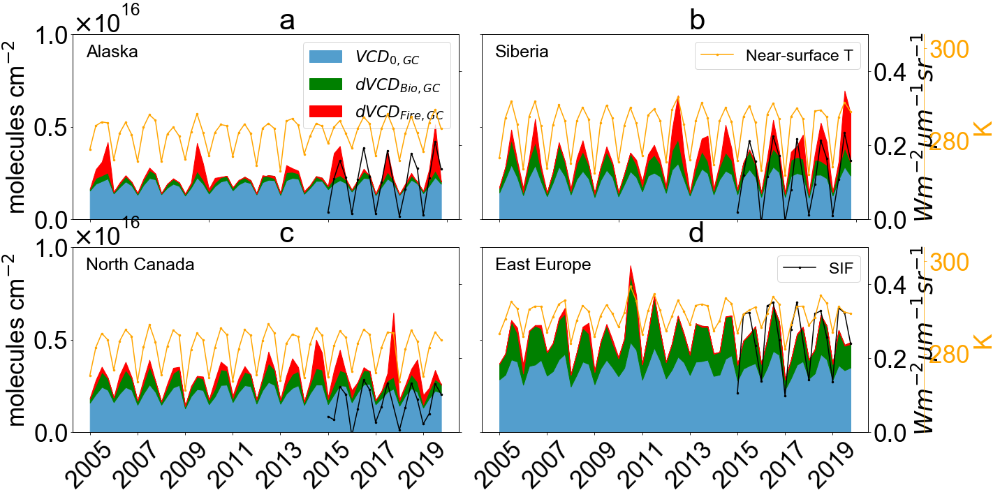

In [67]:
############################################################
#                         Figure 3
############################################################

import matplotlib.ticker as ticker

varlist = [
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK,   mm_sif_ann_15to19_regridded_AllPFT_AK,  mm_Met_TS_05to19_Global_AllPFT_AK ],\
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia,   mm_sif_ann_15to19_regridded_AllPFT_Siberia,  mm_Met_TS_05to19_Global_AllPFT_Siberia ],\
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA,   mm_sif_ann_15to19_regridded_AllPFT_NA,  mm_Met_TS_05to19_Global_AllPFT_NA ],\
    [mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU,   mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU,   mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU,   mm_sif_ann_15to19_regridded_AllPFT_EastEU,  mm_Met_TS_05to19_Global_AllPFT_EastEU ],\

]


titleindex = ["Alaska","Siberia",'North Canada','East Europe']
panelindex = ["a","b","c","d"]

ipanel = 0
ipanelindex = [1,2,3,4]

fig = plt.figure(figsize=(20,10))
for ivar in varlist: 
    
    vmin=0
    vmax=1e16
    cmap = mpl.cm.RdBu_r
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    


    ax = fig.add_subplot(2,2,ipanelindex[ipanel], aspect='auto')

    x = np.arange( 0,len(ivar[0]) )
    
    # Select some data to plot
    ##############      GC       ###########################
#     ax.plot( x , ivar[0].values, '-', color='#539ecd')
    ax.fill_between(x , ivar[0].values, color='#539ecd')
#     ax.plot( x , ivar[1].values, '-', color='green')
    ax.fill_between(x, ivar[0].values, ivar[1].values, color='green')
#     ax.plot( x , ivar[2].values, '-', color='red')
    ax.fill_between(x , ivar[1].values, ivar[2].values, color='red')
    ##############        OMI      #####################
#     ax.plot(x, ivar[3].values, color='blue', marker='.')

    plt.ylim([vmin,vmax])
    if ipanel in [2,3]:
#         ax.set_xticks( np.linspace(0,60,16) )
        ax.set_xticks( np.linspace(0,56,8) )
        ax.set_xticklabels(np.arange(2005, 2020, 2), rotation=45)  # Set x-tick labels every two years

    else:
        ax.set_xticklabels("")
    if ipanel in [1,3]:
        ax.set_yticklabels("")
    
    
    
    #################. SIF. ######################
    ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
    x_sif = np.concatenate(( np.arange(20+20,31+20),  np.arange(32+20,40+20) ), axis=0)
    ax2.plot(x_sif, ivar[3].values , marker='.',markersize=5,color='k')

    plt.ylim([0,0.5])

        
        
    ################    Temperature     ######################
    ax3 = ax.twinx()  # instantiate a second axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 80))
    ax3.plot(x, ivar[4].values , marker='.',markersize=5, color='orange')
    ax3.spines['right'].set_color('orange')
    ax3.tick_params(axis='y', colors='orange')
    ax3.set_ylim([263,303])
    
    if ipanel in [0,2]:
        ax2.set_yticklabels("")
        ax3.set_yticklabels("")
        ax.set_ylabel("molecules cm$^{-2}$")
        
        # Change the y-axis formatting to scientific notation
#         formatter = ticker.FuncFormatter(lambda x, pos: f'{x:.0e}')
#         ax.yaxis.set_major_formatter(formatter)
        ax.yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))

        
        
    if ipanel in [1,3]:
        ax3.set_ylabel("K", color='orange')
        ax2.set_ylabel("$W m^{-2} μm^{-1} sr^{-1}$")
    if ipanel==1:
        ax3.legend(('Near-surface T',''), fontsize=23)
    if ipanel==0:
        ax.legend(('$VCD_{0,GC}$','$dVCD_{Bio,GC}$','$dVCD_{Fire,GC}$'),  loc="upper right", fontsize=23)


        
        
    ax.annotate(titleindex[ipanel], xy=(0.035, 0.88), xycoords="axes fraction",fontsize=25, fontweight='bold')
    ax.annotate(panelindex[ipanel], xy=(0.535, 1.03), xycoords="axes fraction",fontsize=42, fontweight='bold')
    ipanel+=1


fig.tight_layout(pad=1.08, h_pad=0.5, w_pad=0.5)  # Adjust the tight_layout parameters
plt.subplots_adjust(wspace=0.06, hspace=0.15)  # Adjust the space between subplot panels
# ax.legend(('GC background VCD0','GC Bio dVCD','GC Fire dVCD'),  loc="upper center", fontsize=16)
ax2.legend(('SIF',''), fontsize=23)

# plt.savefig('GC_dVCDs_interannual.png',dpi=300)
plt.savefig('./fig_paper3_HCHOinterannual/Fig5.png',dpi=300,bbox_inches='tight')






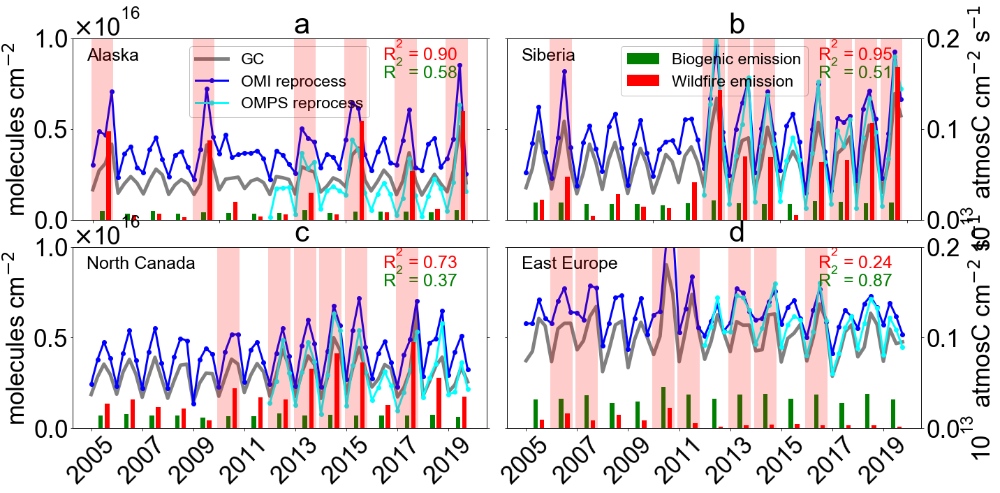

In [69]:
############################################################
#                         Figure 1
############################################################
import numpy.ma as ma

varlist = [
    [mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK,   mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK,  mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK ],\
    [mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia,   mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia,  mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia ],\
    [mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA,   mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA,  mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA ],\
    [mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU,   mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU,   mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU],\

]

emislist = [
    [sum_EmisISOP_Total_05to19_summers_AK + sum_EmisMTPA_Total_05to19_summers_AK,    Emis_BioBurn_05to19_Global_summers_AK  ],\
    [sum_EmisISOP_Total_05to19_summers_Siberia + sum_EmisMTPA_Total_05to19_summers_Siberia,    Emis_BioBurn_05to19_Global_summers_Siberia  ],\
    [sum_EmisISOP_Total_05to19_summers_NA + sum_EmisMTPA_Total_05to19_summers_NA,    Emis_BioBurn_05to19_Global_summers_NA  ],\
    [sum_EmisISOP_Total_05to19_summers_EastEU + sum_EmisMTPA_Total_05to19_summers_EastEU,    Emis_BioBurn_05to19_Global_summers_EastEU  ],\

]
#  The sum_Emis are in unit: TgC/m2, so the 1e12 is converting it to gC/m2
#  In Millet 2008, ISOPe unit is    1e13 atomC cm-2 s-1
#  Here the unit is gC/m2/summertime, convert to Millet's unit, should be:
#    MilletUnit = MyUnit * 
emislist_norm = [
    [ (sum_EmisISOP_Total_05to19_summers_AK + sum_EmisMTPA_Total_05to19_summers_AK)/sum_gridarea_AK * 1e12,    Emis_BioBurn_05to19_Global_summers_AK / sum_gridarea_AK * 1e12  ],\
    [ (sum_EmisISOP_Total_05to19_summers_Siberia + sum_EmisMTPA_Total_05to19_summers_Siberia)/sum_gridarea_Siberia * 1e12,    Emis_BioBurn_05to19_Global_summers_Siberia / sum_gridarea_Siberia * 1e12  ],\
    [ (sum_EmisISOP_Total_05to19_summers_NA + sum_EmisMTPA_Total_05to19_summers_NA)/sum_gridarea_NA * 1e12,    Emis_BioBurn_05to19_Global_summers_NA / sum_gridarea_NA * 1e12  ],\
    [ (sum_EmisISOP_Total_05to19_summers_EastEU + sum_EmisMTPA_Total_05to19_summers_EastEU)/sum_gridarea_EastEU * 1e12,    Emis_BioBurn_05to19_Global_summers_EastEU / sum_gridarea_EastEU * 1e12  ],\

]


titleindex = ["Alaska","Siberia","North Canada","East Europe"]
panelindex = ["a","b","c","d"]


ipanel = 0
ipanelindex = [1,2,3,4]

fig = plt.figure(figsize=(20,10))
for ivar in varlist:
    
    vmin=0
    vmax=1e16
    cmap = mpl.cm.RdBu_r
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    


    ax = fig.add_subplot(2,2,ipanelindex[ipanel], aspect='auto')

    # Select some data to plot
    ##############      GC       ###########################
    x = np.arange( 0,len(ivar[0]) )
    ax.plot( x , ivar[0].values, '-', color='gray', linewidth=5)
    x = np.arange( 0,len(ivar[1]) )
    ax.plot( x , ivar[1].values, 'o-', color='blue', linewidth=3)
    x = np.arange( 0,len(ivar[2]) )+28
    ax.plot( x , ivar[2].values, 'o-', color='cyan', linewidth=3)

    plt.ylim([vmin,vmax])
    if ipanel in [2,3]:
        ax.set_xticks( np.linspace(0,56,8) )
        ax.set_xticklabels(np.arange(2005,2020,2), rotation=45)    
    else:
        ax.set_xticklabels("")
    if ipanel in [1,3]:
        ax.set_yticklabels("")
        
        
    #################     Emission     ######################
    ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis    
    width = 0.7
    
    #  Wildfire emission
    x_bar1 = np.arange( 0,len(ivar[0]) ).reshape((15,4))[:,1] + 0.5
    ax2.bar(x_bar1, convert_gC_m2_summertime_to_1e13_atomC_cm2_s(  emislist_norm[ipanel][0]  )  ,\
            width=width, label='boy',fc = 'green')

    #  Biogenic emission
    x_bar2 = np.arange( 0,len(ivar[0]) ).reshape((15,4))[:,2] + 0.5
    ax2.bar(x_bar2,  convert_gC_m2_summertime_to_1e13_atomC_cm2_s(  emislist_norm[ipanel][1]  ) ,\
            width=width, label='girl',fc = 'red')
    
    # high year index
    tmp = ivar[0].copy()
    tmp = tmp[tmp.time.dt.month==7]
    tmp_Highyears_list = [Highyears_list[3],Highyears_list[1],Highyears_list[2],Highyears_list[0]]
    tmp[~tmp.time.dt.year.isin(tmp_Highyears_list[ipanel])]=np.nan
    
    x_bar3 = np.arange( 0,len(ivar[0]) ).reshape((15,4))[:,1] + 0.5
    ax2.bar(x_bar3,  tmp.values ,\
            width=width*5, label='girl',fc = 'red', alpha=0.2)
    
    
    ax2.set_ylim([0,0.2])

    if ipanel in [0,2]:
        ax2.set_yticklabels("")
        ax.set_ylabel("molecules cm$^{-2}$")
        ax.yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
    if ipanel in [1,3]:
        ax2.set_ylabel("10$\mathregular{^{13}}$ atmosC cm$^{-2}$ s$^{-1}$")
#         ax2.set_yticklabels("")
    
    if ipanel ==0:
        ax.legend(('GC','OMI reprocess','OMPS reprocess'),  loc="upper center", fontsize=23,\
                 facecolor='none', edgecolor='k', framealpha=0.25)
    if ipanel ==1:
#         ax2.legend(('Isop + Mono emission','Wildfire NMVOC emission') , loc="upper center", fontsize=16)
        ax2.legend(('Biogenic emission','Wildfire emission') , loc="upper center", fontsize=23,\
                   facecolor='none', edgecolor='k', framealpha=0.25)
        

        
        
    ax.annotate(titleindex[ipanel], xy=(0.035, 0.88), xycoords="axes fraction",fontsize=25, fontweight='bold')
    ax.annotate(panelindex[ipanel], xy=(0.535, 1.03), xycoords="axes fraction",fontsize=42, fontweight='bold')
    #   R^2 = ??
    R2 = ma.corrcoef(  ma.masked_invalid(ivar[0].resample(time='1Y').mean(dim='time')),\
                       ma.masked_invalid(emislist_norm[ipanel][1])  )[0,1]**2
#     plt.figtext( 0.88,  0.98-0.07,   'R$\mathregular{^2}$ = '+format(R2,'.2f'),fontsize=18)
    ax.annotate(   'R$\mathregular{^2}$ = '+format(R2,'.2f') , xy=(0.75, 0.88), xycoords="axes fraction",fontsize=25, fontweight='bold', color='red')
    R2 = ma.corrcoef(  ma.masked_invalid(ivar[0].resample(time='1Y').mean(dim='time')),\
                       ma.masked_invalid(emislist_norm[ipanel][0])  )[0,1]**2
    ax.annotate(   'R$\mathregular{^2}$ = '+format(R2,'.2f') , xy=(0.75, 0.78), xycoords="axes fraction",fontsize=25, fontweight='bold', color='green')


    ipanel+=1
    


fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.15)#调整子图间距
# plt.savefig('VCD_interannual.png',dpi=300)
plt.savefig('./fig_paper3_HCHOinterannual/Fig2.png',dpi=300,bbox_inches='tight')

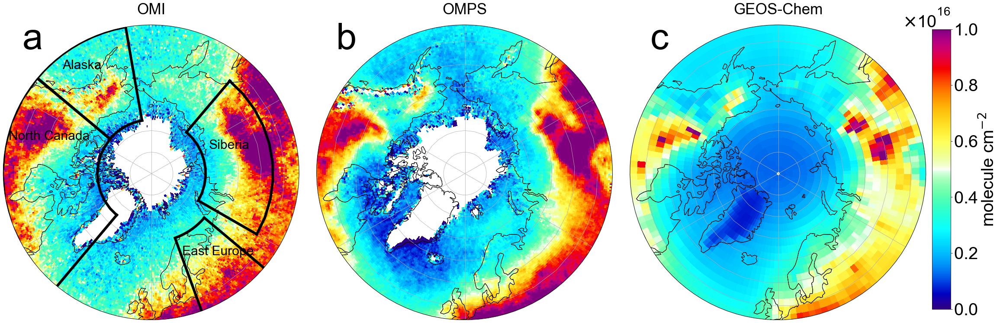

In [58]:
############################################################
#                         Figure 2
############################################################

fig = plt.figure(figsize=[30,10])
    
    

mon=7
vminmax = [0, 10e15]
levels = np.linspace(vminmax[0], vminmax[1], 50)

#============================================================
#    Plot   OMI   2005-2019 July mean
#============================================================
ax = define_map_3panels(1)

tmp = mm_HCHOVCD_OMI_05to19_Global_new
tmp = add_180_to_lon(tmp)
vcd = tmp[(tmp.time.dt.month==mon)&(tmp.time.dt.year>=2013)]
im=plt.pcolormesh(vcd.lon, vcd.lat,\
            vcd.mean(dim='time'),\
            vmin=vminmax[0] , vmax=vminmax[1],\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
#             levels=levels,\
            cmap=cmaps.NCV_jaisnd
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
ax.text(0.1, 0.95, "a", fontsize=85, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.05, "OMI", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# ax.annotate("(a) OMI reprocess", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=30, fontweight='bold')

plot_region()
ax.annotate("Alaska", xy=(0.20, 0.85), xycoords="axes fraction",fontsize=30, fontweight='bold')
ax.annotate("North Canada", xy=(0.018, 0.61), xycoords="axes fraction",fontsize=30, fontweight='bold')
ax.annotate("Siberia", xy=(0.695, 0.58), xycoords="axes fraction",fontsize=30, fontweight='bold')
ax.annotate("East Europe", xy=(0.605, 0.22), xycoords="axes fraction",fontsize=30, fontweight='bold')



#============================================================
#    Plot   OMPS  2012-2019 July mean
#============================================================
ax = define_map_3panels(2)

tmp = mm_HCHOVCD_OMPS_12to19_Global_new
tmp = add_180_to_lon(tmp)
vcd = tmp[(tmp.time.dt.month==mon)&(tmp.time.dt.year>=2013)]
im=plt.pcolormesh(vcd.lon, vcd.lat,\
            vcd.mean(dim='time'),\
            vmin=vminmax[0] , vmax=vminmax[1],\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
#             levels=levels,\
            cmap=cmaps.NCV_jaisnd
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
ax.text(0.1, 0.95, "b", fontsize=85, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.05, "OMPS", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# plt.title("OMI reprocess "+str(iyear)+"-07")
# ax.annotate("(b) OMPS reprocess", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=30, fontweight='bold')

# plot_region()



#============================================================
#    Plot   GC VCD  2005-2019 July mean
#============================================================
ax = define_map_3panels(3)

tmp = mm_HCHOVCD_GC_05to19_WF_Global
tmp = add_180_to_lon(tmp)
vcd = tmp[(tmp.time.dt.month==mon)&(tmp.time.dt.year>=2013)]
im=plt.pcolormesh(vcd.lon, vcd.lat,\
            vcd.mean(dim='time'),\
            vmin=vminmax[0] , vmax=vminmax[1],\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
#             levels=levels,\
            cmap=cmaps.NCV_jaisnd
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
ax.text(0.1, 0.95, "c", fontsize=85, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.05, "GEOS-Chem", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# ax.annotate("(c) GC", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=30, fontweight='bold')

# plot_region()

#----------------------------------------------------------------------------------------------------------

fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.01)#调整子图间距
position=fig.add_axes([1, 0.05, 0.02, 0.9])
cb = fig.colorbar(im,cax=position,orientation='vertical')
cb.set_label('molecule cm$^{-2}$', fontsize=40)
cb.ax.tick_params(labelsize=40)
cb.ax.yaxis.get_offset_text().set_fontsize(40)

# Set the tick labels of the colorbar to use scientific notation
cb.formatter = ScalarFormatter(useMathText=True)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()





# plt.savefig('VCDs_pattern.svg')
# plt.savefig('VCDs_pattern.png',dpi=300,bbox_inches='tight')
plt.savefig('./fig_paper3_HCHOinterannual/Fig1a.png',dpi=300,bbox_inches='tight')
plt.show()

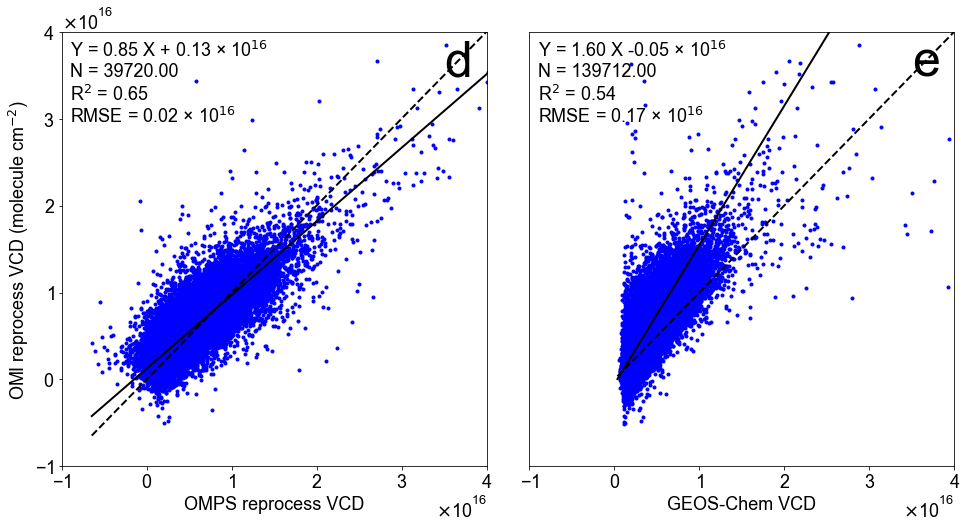

In [62]:
import numpy.ma as ma
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

tmp_fw = 0.06
tmp_fh = -0.13

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# First subplot (OMI vs GC)
tmp_y = get_land(mm_HCHOVCD_OMI_05to19_Global_new_2x25.loc[mm_HCHOVCD_OMPS_12to19_Global_new_2x25.time]).values.flatten()
tmp_x = get_land(mm_HCHOVCD_OMPS_12to19_Global_new_2x25).values.flatten()


ax1 = axes[0]
ax1.scatter(tmp_x, tmp_y, color='b', marker='.')

# Plot settings for the first subplot
s, i = rum.utilities.LR_SMA(xr.DataArray(tmp_x), xr.DataArray(tmp_y))
line_x = np.array([np.nanmin(tmp_x), np.nanmax(tmp_x)])
ax1.plot(line_x, line_x, '--', color='k', linewidth=2)
ax1.plot(line_x, line_x * s + i, '-', color='k', linewidth=2)

# Text annotations for the first subplot
if i < 0:
    equation_text = 'Y = {:.2f} X {:.2f} × 10$^{{16}}$'.format(s, i * 1e-16)
else:
    equation_text = 'Y = {:.2f} X + {:.2f} × 10$^{{16}}$'.format(s, i * 1e-16)

# Text annotations for the first subplot
annotation_spacing = 0.05

ax1.annotate(equation_text, (0.02, 0.98), xycoords='axes fraction', fontsize=18, va='top', ha='left')

count = (~np.isnan(tmp_y) * 1).sum()
ax1.annotate('N = {:.2f}'.format(count), (0.02, 0.98 - annotation_spacing), xycoords='axes fraction', fontsize=18, va='top', ha='left')

r_squared = ma.corrcoef(ma.masked_invalid(tmp_x), ma.masked_invalid(tmp_y))[0, 1] ** 2
ax1.annotate('R$^2$ = {:.2f}'.format(r_squared), (0.02, 0.98 - 2 * annotation_spacing), xycoords='axes fraction', fontsize=18, va='top', ha='left')

rmse = rum.utilities.rmse(np.nan_to_num(tmp_x), np.nan_to_num(tmp_x * s + i)) * 1e-16
ax1.annotate('RMSE = {:.2f} × 10$^{{16}}$'.format(rmse), (0.02, 0.98 - 3 * annotation_spacing), xycoords='axes fraction', fontsize=18, va='top', ha='left')






ax1.set_ylim([-1e16, 4e16])
ax1.set_xlim([-1e16, 4e16])

ax1.set_xlabel('OMPS reprocess VCD')
ax1.set_ylabel('OMI reprocess VCD (molecule cm$^{-2}$)')


ax1.xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
ax1.yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
ax1.ticklabel_format(style='sci', axis='both', scilimits=(0, 0))
ax1.annotate('d', xy=(0.9, 0.9), xycoords='axes fraction', fontsize=50, fontweight='bold')





# Second subplot (OMI vs OMPS)
tmp_y = get_land(mm_HCHOVCD_OMI_05to19_Global_new_2x25.loc[mm_HCHOVCD_OMPS_12to19_Global_new_2x25.time]).values.flatten()
tmp_x = get_land(mm_HCHOVCD_GC_05to19_WF_Global.loc[mm_HCHOVCD_OMPS_12to19_Global_new_2x25.time]).values.flatten()

ax2 = axes[1]
ax2.scatter(tmp_x, tmp_y, color='b', marker='.')

# Plot settings for the second subplot
s, i = rum.utilities.LR_SMA(xr.DataArray(tmp_x), xr.DataArray(tmp_y))
line_x = np.array([np.nanmin(tmp_x), np.nanmax(tmp_x)])
ax2.plot(line_x, line_x, '--', color='k', linewidth=2)
ax2.plot(line_x, line_x * s + i, '-', color='k', linewidth=2)

# Text annotations for the second subplot
if i < 0:
    equation_text = 'Y = {:.2f} X {:.2f} × 10$^{{16}}$'.format(s, i * 1e-16)
else:
    equation_text = 'Y = {:.2f} X + {:.2f} × 10$^{{16}}$'.format(s, i * 1e-16)

# Text annotations for the first subplot
annotation_spacing = 0.05

ax2.annotate(equation_text, (0.02, 0.98), xycoords='axes fraction', fontsize=18, va='top', ha='left')

count = (~np.isnan(tmp_x) * 1).sum()
ax2.annotate('N = {:.2f}'.format(count), (0.02, 0.98 - annotation_spacing), xycoords='axes fraction', fontsize=18, va='top', ha='left')

r_squared = ma.corrcoef(ma.masked_invalid(tmp_x), ma.masked_invalid(tmp_y))[0, 1] ** 2
ax2.annotate('R$^2$ = {:.2f}'.format(r_squared), (0.02, 0.98 - 2 * annotation_spacing), xycoords='axes fraction', fontsize=18, va='top', ha='left')

rmse = rum.utilities.rmse(np.nan_to_num(tmp_x), np.nan_to_num(tmp_x * s + i)) * 1e-16
ax2.annotate('RMSE = {:.2f} × 10$^{{16}}$'.format(rmse), (0.02, 0.98 - 3 * annotation_spacing), xycoords='axes fraction', fontsize=18, va='top', ha='left')




ax2.set_ylim([-1e16, 4e16])
ax2.set_xlim([-1e16, 4e16])


ax2.set_xlabel('GEOS-Chem VCD')



ax2.xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
# ax2.yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
ax2.set_yticks([])
ax2.ticklabel_format(style='sci', axis='both', scilimits=(0, 0))

ax2.annotate('e', xy=(0.9, 0.9), xycoords='axes fraction', fontsize=50, fontweight='bold')



# Adjust the distance between the subplots
fig.subplots_adjust(wspace=0.1)  # Increase or decrease the value to control the distance
plt.savefig('./fig_paper3_HCHOinterannual/Fig1b.png',dpi=300,bbox_inches='tight')
plt.show()


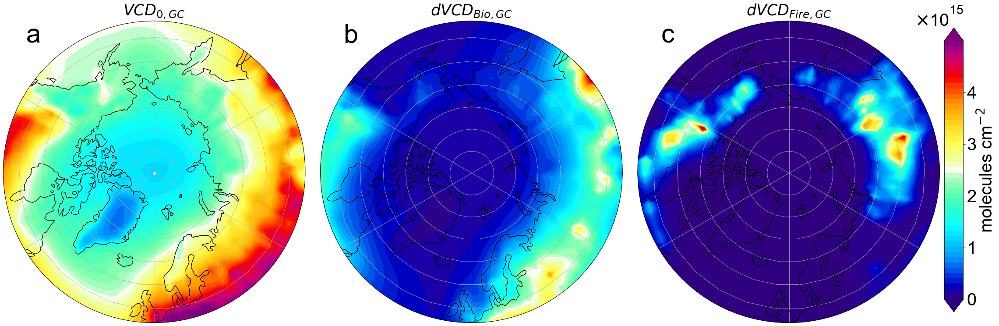

In [53]:
############################################################
#                         Figure 2
############################################################
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter

fig = plt.figure(figsize=[30,10])
    
    

mon=7
vminmax = [0, 0.5e16]
levels = np.linspace(vminmax[0], vminmax[1], 50)

#============================================================
#    Plot   GC VCD0  2005-2019 July mean
#============================================================
ax = define_map_3panels(1)

tmp = mm_HCHOVCD_GC_05to19_Boff_NoWF_Global
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            vcd.mean(dim='time'),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
            cmap=cmaps.NCV_jaisnd
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
ax.text(0.1, 0.95, "a", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, "$VCD_{0,GC}$", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# plot_region()



#============================================================
#    Plot   GC dVCD_Bio  2005-2019 July mean
#============================================================
ax = define_map_3panels(2)

tmp = mm_HCHOVCD_GC_05to19_NoWF_Global - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            vcd.mean(dim='time'),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
            cmap=cmaps.NCV_jaisnd
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
# plt.title("OMI reprocess "+str(iyear)+"-07")
ax.text(0.1, 0.95, "b", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, "$dVCD_{Bio,GC}$", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')


# plot_region()



#============================================================
#    Plot   GC dVCD_Fire  2005-2019 July mean
#============================================================
ax = define_map_3panels(3)

tmp = mm_HCHOVCD_GC_05to19_WF_Global - mm_HCHOVCD_GC_05to19_NoWF_Global
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            vcd.mean(dim='time'),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
            cmap=cmaps.NCV_jaisnd
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
ax.text(0.1, 0.95, "c", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, "$dVCD_{Fire,GC}$", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# plot_region()

#----------------------------------------------------------------------------------------------------------

fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.01)#调整子图间距
position=fig.add_axes([1, 0.05, 0.02, 0.9])

cb = plt.colorbar(im,cax=position,\
                 orientation='vertical')

ticks = np.arange(0,5e15,1e15)
cb.set_ticks(ticks)
cb.set_ticklabels(ticks)

# Set the tick labels of the colorbar to use scientific notation
cb.formatter = ScalarFormatter(useMathText=True)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()

cb.set_label('molecules cm$^{-2}$', fontsize=40)
cb.ax.tick_params(labelsize=40)
cb.ax.yaxis.get_offset_text().set_fontsize(40)

plt.savefig('./fig_paper3_HCHOinterannual/Fig4a.png',dpi=300,bbox_inches='tight')
plt.show()

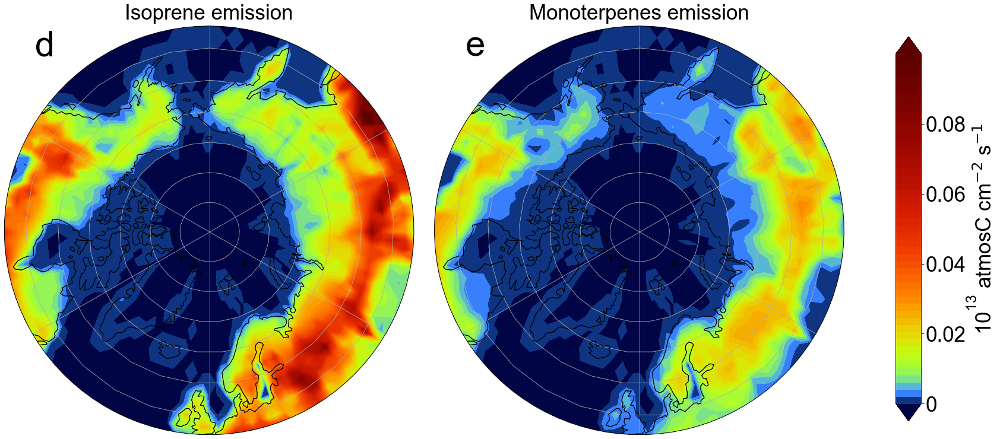

In [289]:
############################################################
#                         Figure 2
############################################################
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter

fig = plt.figure(figsize=[30,10])
    

mon=7
vminmax = [0, 0.1]
levels = np.linspace(vminmax[0], vminmax[1], 50)

#============================================================
#    Plot   GC VCD0  2005-2019 July mean
#============================================================
ax = define_map_3panels(1)

tmp = mm_EmisISOP_Total_05to19_Global
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s( vcd.mean(dim='time') ),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
            cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
ax.text(0.1, 0.95, "d", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, 'Isoprene emission', fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# plot_region()



#============================================================
#    Plot   GC dVCD_Bio  2005-2019 July mean
#============================================================
ax = define_map_3panels(2)

tmp = mm_EmisMTPA_Total_05to19_Global
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  vcd.mean(dim='time')  ),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
            cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
# plt.title("OMI reprocess "+str(iyear)+"-07")
# ax.annotate("(e) APIN+BPIN emission", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=42, fontweight='bold')
ax.text(0.1, 0.95, "e", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
# ax.text(0.5, 1.03, r'$\alpha$-pinene + $\beta$-pinene'+" emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, "Monoterpenes emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# plot_region()


#----------------------------------------------------------------------------------------------------------

fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.01)#调整子图间距
position=fig.add_axes([0.7, 0.05, 0.02, 0.9])

cb = plt.colorbar(im,cax=position,\
                 orientation='vertical')

ticks = np.arange(0,0.1,0.02)
formatted_ticks = [f"{tick:.2g}" for tick in ticks]
cb.set_ticks(ticks)
cb.set_ticklabels(formatted_ticks)

# Set the tick labels of the colorbar to use scientific notation
# cb.formatter = ScalarFormatter(useMathText=True)
# cb.formatter.set_powerlimits((0, 0))
# cb.update_ticks()

cb.set_label('10$\mathregular{^{13}}$ atmosC cm$^{-2}$ s$^{-1}$', fontsize=35)
cb.ax.tick_params(labelsize=35)
cb.ax.yaxis.get_offset_text().set_fontsize(35)


# plt.savefig('GC_dVCDs_patterns_Notexyt.png',dpi=300,bbox_inches='tight')

plt.show()

In [309]:
#============================================================
#   GC VCD
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU ) )
print(  "GC VCD,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia ) )
print(  "GC VCD,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA ) )
print(  "GC VCD,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK ) )
print(  "GC VCD,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

print("")

#============================================================
#   GC VCD0
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU) )
print(  "GC VCD0,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia) )
print(  "GC VCD0,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA) )
print(  "GC VCD0,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK ,  mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK) )
print(  "GC VCD0,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )


print("")

#============================================================
#   GC dVCD_Bio
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU) )
print(  "GC dVCD_Bio,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia) )
print(  "GC dVCD_Bio,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA) )
print(  "GC dVCD_Bio,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK ,     mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK) )
print(  "GC dVCD_Bio,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

print("")

#============================================================
#   GC dVCD_Fire
#============================================================
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU) )
print(  "GC dVCD_Fire,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia) )
print(  "GC dVCD_Fire,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA) )
print(  "GC dVCD_Fire,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK ,    mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK) )
print(  "GC dVCD_Fire,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

print("")

#============================================================
#   SIF CV
#============================================================
tmp = float( calculate_cv(mm_sif_ann_15to19_regridded_AllPFT_EastEU ,  mm_sif_ann_15to19_regridded_AllPFT_EastEU) )
print(  "OCO2 SIF,   Eastern Europe,  CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_sif_ann_15to19_regridded_AllPFT_Siberia ,  mm_sif_ann_15to19_regridded_AllPFT_Siberia) )
print(  "OCO2 SIF,   Siberia,         CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_sif_ann_15to19_regridded_AllPFT_NA ,  mm_sif_ann_15to19_regridded_AllPFT_NA) )
print(  "OCO2 SIF,   North Canada,    CV:  " + format(tmp, '.1f')  +"%" )
tmp = float( calculate_cv(mm_sif_ann_15to19_regridded_AllPFT_AK ,  mm_sif_ann_15to19_regridded_AllPFT_AK) )
print(  "OCO2 SIF,   Alaska,          CV:  " + format(tmp, '.1f')  +"%" )

GC VCD,   Eastern Europe,  CV:  8.8%
GC VCD,   Siberia,         CV:  13.8%
GC VCD,   North Canada,    CV:  8.5%
GC VCD,   Alaska,          CV:  15.2%

GC VCD0,   Eastern Europe,  CV:  3.9%
GC VCD0,   Siberia,         CV:  2.3%
GC VCD0,   North Canada,    CV:  3.5%
GC VCD0,   Alaska,          CV:  3.3%

GC dVCD_Bio,   Eastern Europe,  CV:  4.5%
GC dVCD_Bio,   Siberia,         CV:  1.6%
GC dVCD_Bio,   North Canada,    CV:  2.1%
GC dVCD_Bio,   Alaska,          CV:  1.7%

GC dVCD_Fire,   Eastern Europe,  CV:  1.6%
GC dVCD_Fire,   Siberia,         CV:  12.4%
GC dVCD_Fire,   North Canada,    CV:  7.9%
GC dVCD_Fire,   Alaska,          CV:  13.2%

OCO2 SIF,   Eastern Europe,  CV:  3.9%
OCO2 SIF,   Siberia,         CV:  9.6%
OCO2 SIF,   North Canada,    CV:  1.6%
OCO2 SIF,   Alaska,          CV:  6.2%


In [50]:
vcdomi_list=[mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_EastEU.resample(time='1Y').mean(dim='time'),\
             mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_Siberia.resample(time='1Y').mean(dim='time'),\
             mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_NA.resample(time='1Y').mean(dim='time'),\
             mm_HCHOVCD_OMI_05to19_Global_new_AllPFT_AK.resample(time='1Y').mean(dim='time')]

vcdomps_list=[mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_EastEU.resample(time='1Y').mean(dim='time'),\
             mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_Siberia.resample(time='1Y').mean(dim='time'),\
             mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_NA.resample(time='1Y').mean(dim='time'),\
             mm_HCHOVCD_OMPS_12to19_Global_new_AllPFT_AK.resample(time='1Y').mean(dim='time')]

vcdgc_list=[mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU.resample(time='1Y').mean(dim='time'),\
         mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia.resample(time='1Y').mean(dim='time'),\
         mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA.resample(time='1Y').mean(dim='time'),\
         mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK.resample(time='1Y').mean(dim='time')]

vcd0gc_list=[mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU.resample(time='1Y').mean(dim='time'),\
         mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia.resample(time='1Y').mean(dim='time'),\
         mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA.resample(time='1Y').mean(dim='time'),\
         mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK.resample(time='1Y').mean(dim='time')]

dvcdbiogc_list=[(mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_EastEU).resample(time='1Y').mean(dim='time'),\
         (mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_Siberia).resample(time='1Y').mean(dim='time'),\
         (mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_NA).resample(time='1Y').mean(dim='time'),\
         (mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_Boff_NoWF_Global_AllPFT_AK).resample(time='1Y').mean(dim='time')]

dvcdfiregc_list=[(mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_EastEU - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_EastEU).resample(time='1Y').mean(dim='time'),\
         (mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_Siberia - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_Siberia).resample(time='1Y').mean(dim='time'),\
         (mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_NA - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_NA).resample(time='1Y').mean(dim='time'),\
         (mm_HCHOVCD_GC_05to19_WF_Global_AllPFT_AK - mm_HCHOVCD_GC_05to19_NoWF_Global_AllPFT_AK).resample(time='1Y').mean(dim='time')]

noxgc_list=[mm_SpeciesConc_NOx_05to19_Global_AllPFT_EastEU.resample(time='1Y').mean(dim='time'),\
         mm_SpeciesConc_NOx_05to19_Global_AllPFT_Siberia.resample(time='1Y').mean(dim='time'),\
         mm_SpeciesConc_NOx_05to19_Global_AllPFT_NA.resample(time='1Y').mean(dim='time'),\
         mm_SpeciesConc_NOx_05to19_Global_AllPFT_AK.resample(time='1Y').mean(dim='time')]


isope_list = [(sum_EmisISOP_Total_05to19_summers_EastEU)/sum_gridarea_EastEU * 1e12,\
              (sum_EmisISOP_Total_05to19_summers_Siberia)/sum_gridarea_Siberia * 1e12,\
              (sum_EmisISOP_Total_05to19_summers_NA)/sum_gridarea_NA * 1e12,\
              (sum_EmisISOP_Total_05to19_summers_AK)/sum_gridarea_AK * 1e12,]

monoe_list = [(sum_EmisMTPA_Total_05to19_summers_EastEU )/sum_gridarea_EastEU * 1e12,\
              (sum_EmisMTPA_Total_05to19_summers_Siberia )/sum_gridarea_Siberia * 1e12,\
              (sum_EmisMTPA_Total_05to19_summers_NA )/sum_gridarea_NA * 1e12,\
              (sum_EmisMTPA_Total_05to19_summers_AK )/sum_gridarea_AK * 1e12,]

bioburne_list = [Emis_BioBurn_05to19_Global_summers_EastEU / sum_gridarea_EastEU * 1e12,\
                 Emis_BioBurn_05to19_Global_summers_Siberia / sum_gridarea_Siberia * 1e12,\
                 Emis_BioBurn_05to19_Global_summers_NA / sum_gridarea_NA * 1e12,\
                 Emis_BioBurn_05to19_Global_summers_AK / sum_gridarea_AK * 1e12] 

def reorder_list(original_list, reorder_list):
    new_list = []
    for i in reorder_list:
        new_list.append(original_list[i])
    return new_list

def create_dataarray_from_np(data, time_coord):
    # Create a new xarray DataArray using the input numpy array
    # and time coordinate from the input DataArray.
    new_dataarray = xr.DataArray(
        data,
        dims=("time",),
        coords={"time": time_coord},
    )
    return new_dataarray


tmp_time_coord = mm_HCHOVCD_GC_05to19_WF_Global.resample(time='1Y').mean(dim='time').time
isope_list = [create_dataarray_from_np( da, tmp_time_coord) for da in isope_list]
monoe_list = [create_dataarray_from_np( da, tmp_time_coord) for da in monoe_list]
bioburne_list = [create_dataarray_from_np( da, tmp_time_coord) for da in bioburne_list]

In [51]:
# Calculate CV for each list
cv_omi = [calculate_cv(da,da) for da in vcdomi_list]
cv_omps = [calculate_cv(da,da) for da in vcdomps_list]
cv_gc = [calculate_cv(da,da) for da in vcdgc_list]

# cv_omi = [calculate_cv(da[7:],da[7:]) for da in vcdomi_list]
# cv_omps = [calculate_cv(da,da) for da in vcdomps_list]
# cv_gc = [calculate_cv(da[7:],da[7:]) for da in vcdgc_list]


# Calculate CV contribution for vcdgc_list
def contribution_cv(a, x):
    # Calculate variances
    var_a = np.var(a)
    var_x = np.var(x)
    # Calculate the contribution of A
    contribution_a = var_a / var_x
    return contribution_a

# Function to add the value as text near the bar
def add_value_labels(ax, rects, values, ypos=3.2):
    ivar=0
    for i, rect in enumerate(rects):
        if ivar==3:
            ypos = -3.4
        ax.annotate(f'{values[i]:.2f}',
                    xy=(rect.get_x() + rect.get_width() / 2, ypos),
                    textcoords="data",
                    ha='center', va='bottom',
                    fontsize=20)
        ivar+=1

contribution_vcd0gc = [contribution_cv(da1,da2) for da1,da2 in zip(vcd0gc_list,vcdgc_list) ]
contribution_dvcdbiogc = [contribution_cv(da1,da2) for da1,da2 in zip(dvcdbiogc_list,vcdgc_list) ]
contribution_dvcdfiregc = [contribution_cv(da1,da2) for da1,da2 in zip(dvcdfiregc_list,vcdgc_list) ]

cv_0gc = [da*k for da,k in zip(cv_gc,  contribution_vcd0gc) ]
cv_biogc = [da*k for da,k in zip(cv_gc,  contribution_dvcdbiogc) ]
cv_firegc = [da*k for da,k in zip(cv_gc,  contribution_dvcdfiregc) ]

# Calculate trend for each list
trend_omi = [calculate_yearly_trend(da) for da in vcdomi_list]
trend_omps = [calculate_yearly_trend(da) for da in vcdomps_list]
trend_gc = [calculate_yearly_trend(da) for da in vcdgc_list]
trend_0gc = [calculate_yearly_trend(da) for da in vcd0gc_list]
trend_biogc = [calculate_yearly_trend(da) for da in dvcdbiogc_list]
trend_firegc = [calculate_yearly_trend(da) for da in dvcdfiregc_list]

trend_noxgc = [calculate_yearly_trend(da) for da in noxgc_list]
trend_isope = [calculate_yearly_trend(  da  ) for da in isope_list]
trend_monoe = [calculate_yearly_trend(  da  ) for da in monoe_list]
trend_bioburne = [calculate_yearly_trend(  da  ) for da in bioburne_list]


# reorder to make plot
cv_omi = reorder_list(cv_omi, [3,1,2,0])
cv_omps = reorder_list(cv_omps, [3,1,2,0])
cv_gc = reorder_list(cv_gc, [3,1,2,0])
cv_0gc = reorder_list(cv_0gc, [3,1,2,0])
cv_biogc = reorder_list(cv_biogc, [3,1,2,0])
cv_firegc = reorder_list(cv_firegc, [3,1,2,0])

trend_omi = reorder_list(trend_omi, [3,1,2,0])
trend_omps = reorder_list(trend_omps, [3,1,2,0])
trend_gc = reorder_list(trend_gc, [3,1,2,0])
trend_0gc = reorder_list(trend_0gc, [3,1,2,0])
trend_biogc = reorder_list(trend_biogc, [3,1,2,0])
trend_firegc = reorder_list(trend_firegc, [3,1,2,0])
trend_noxgc = reorder_list(trend_noxgc, [3,1,2,0])
trend_isope = reorder_list(trend_isope, [3,1,2,0])
trend_monoe = reorder_list(trend_monoe, [3,1,2,0])
trend_bioburne = reorder_list(trend_bioburne, [3,1,2,0])



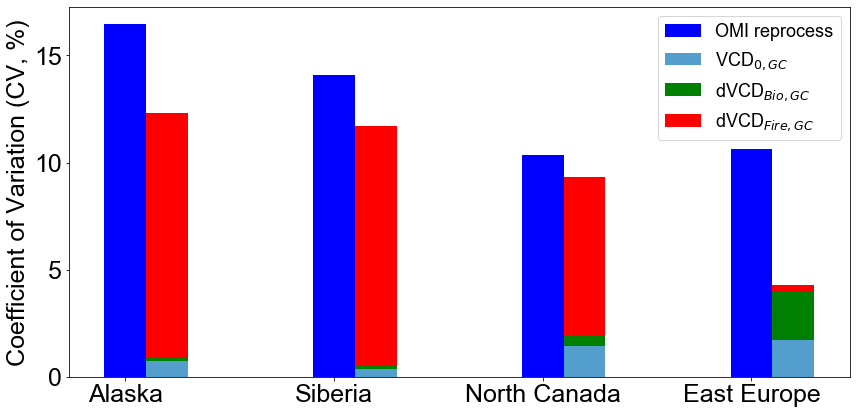

In [52]:
# Define bar plot parameters
width = 0.2
regions = ['Alaska', 'Siberia', 'North Canada', 'East Europe']
x = np.arange(len(regions))

# Create a single subplot
fig, ax2 = plt.subplots(figsize=(12, 6))

# Bottom panel - CV and CV contribution
rects7 = ax2.bar(x, cv_omi, width, label='OMI reprocess', color='blue')
# rects8 = ax2.bar(x, cv_omps, width, label='OMPS reprocess', color='cyan')

# Stacked bars for CV_GC, CV_0GC, CV_BIOGC, and CV_FIREGC
rects9 = ax2.bar(x + width, cv_0gc, width, label='VCD$_{0,GC}$', color='#539ecd')
rects10 = ax2.bar(x + width, cv_biogc, width, bottom=cv_0gc, label='dVCD$_{Bio,GC}$', color='green')
rects11 = ax2.bar(x + width, cv_firegc, width, bottom=np.array(cv_0gc) + np.array(cv_biogc), label='dVCD$_{Fire,GC}$', color='red')

ax2.set_ylabel('Coefficient of Variation (CV, %)', fontsize=25)
ax2.set_xticks(x)
ax2.set_yticks(np.arange(0,20,5))
ax2.set_yticklabels(np.arange(0,20,5),fontsize=25)
ax2.set_xticklabels(regions,fontsize=25)
# ax2.annotate('b', xy=(0.02, 0.84), xycoords='axes fraction', fontsize=50, fontweight='bold')

ax2.legend(fontsize=18)

fig.tight_layout()# Adjust overall spacing
plt.subplots_adjust(wspace =0.1, hspace =0.0)# Adjust spacing between subplots
plt.savefig('./fig_paper3_HCHOinterannual/Fig3.png',dpi=300,bbox_inches='tight')
plt.show()


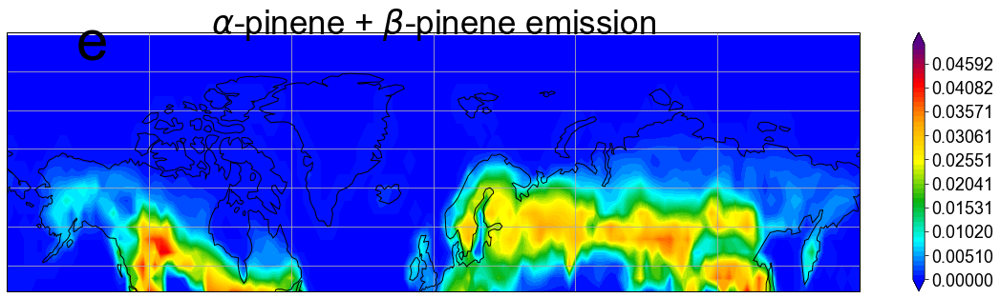

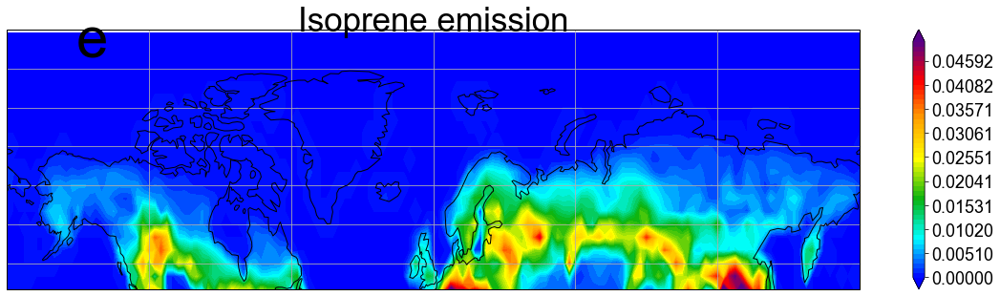

In [60]:
#============================================================
#    Plot   GC dVCD_Bio  2005-2019 July mean
#============================================================

mon=8
vminmax = [0, 0.05]
levels = np.linspace(vminmax[0], vminmax[1], 50)


fig = plt.figure(figsize=(20,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(), aspect='auto')

tmp = mm_EmisMTPA_Total_05to19_Global[mm_EmisMTPA_Total_05to19_Global.time.dt.year==2009]
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  vcd.mean(dim='time')  )   ,\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
            cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
#             cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
# plt.title("OMI reprocess "+str(iyear)+"-07")
# ax.annotate("(e) APIN+BPIN emission", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=42, fontweight='bold')
ax.text(0.1, 0.95, "e", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, r'$\alpha$-pinene + $\beta$-pinene'+" emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
plt.colorbar()


#============================================================
#    Plot   GC dVCD_Bio  2005-2019 July mean
#============================================================
fig = plt.figure(figsize=(20,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(), aspect='auto')

tmp = (mm_EmisISOP_Total_05to19_Global)[mm_EmisISOP_Total_05to19_Global.time.dt.year==2009]
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  vcd.mean(dim='time')  ),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
            cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
#             cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
# plt.title("OMI reprocess "+str(iyear)+"-07")
# ax.annotate("(e) APIN+BPIN emission", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=42, fontweight='bold')
ax.text(0.1, 0.95, "e", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, "Isoprene emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
plt.colorbar()


In [54]:


MOHYCAN_ISOPe_16 = xr.open_dataset("/import/GREENING/tzhao/jndata/MEGAN-MOHYCAN/"+"ISOP_MEGAN-MOHYCAN_2009.nc", engine="netcdf4")["Flux"]
MOHYCAN_MONOe_16 = xr.open_dataset("/import/GREENING/tzhao/jndata/MEGAN-MOHYCAN/"+"MONOT_MEGAN-MOHYCAN_2009.nc", engine="netcdf4")["Flux"]

# Create a new DataArray with the data from x and new coordinates
MOHYCAN_ISOPe_16 = xr.DataArray(
    MOHYCAN_ISOPe_16.values,
    coords={"time": pd.date_range('2016-01-01', '2016-12-01', freq='MS'),\
            "lat": np.linspace(90,-90,360), "lon": np.linspace(0,360,720)},
    dims=("time", "lat", "lon"),
)

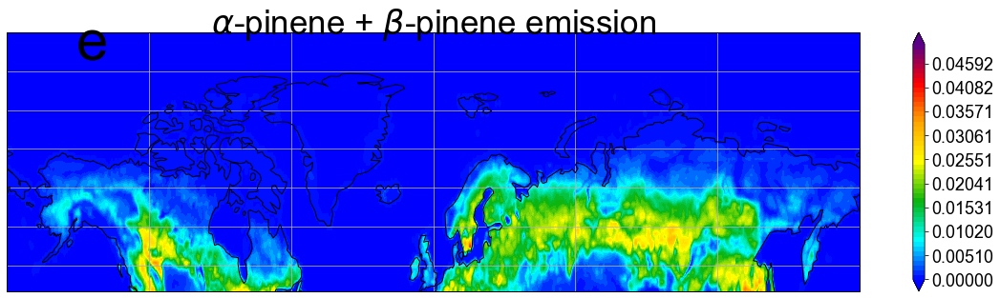

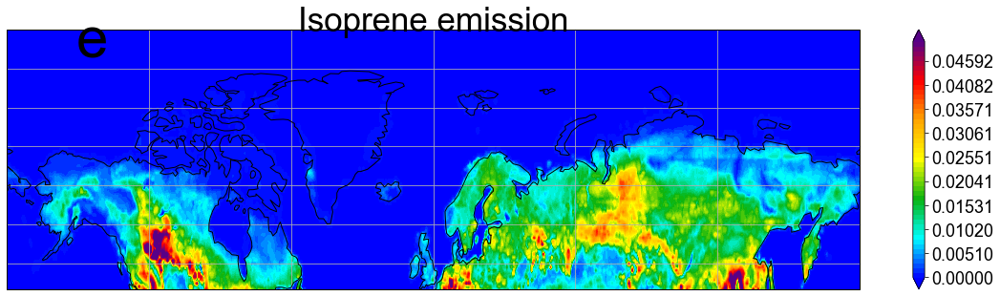

In [58]:
#============================================================
#    Plot   GC dVCD_Bio  2005-2019 July mean
#============================================================

mon=7
vminmax = [0, 0.05]
levels = np.linspace(vminmax[0], vminmax[1], 50)


fig = plt.figure(figsize=(20,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(), aspect='auto')

vcd = MOHYCAN_MONOe_16[mon]
# tmp = add_180_to_lon( tmp )
# vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(np.linspace(0,360,720), np.linspace(90,-90,360),\
            vcd*10/1e13,\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
            cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
#             cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
# plt.title("OMI reprocess "+str(iyear)+"-07")
# ax.annotate("(e) APIN+BPIN emission", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=42, fontweight='bold')
ax.text(0.1, 0.95, "e", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, r'$\alpha$-pinene + $\beta$-pinene'+" emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
plt.colorbar()


fig = plt.figure(figsize=(20,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(), aspect='auto')

vcd = MOHYCAN_ISOPe_16[mon]
# tmp = add_180_to_lon( tmp )
# vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(np.linspace(0,360,720), np.linspace(90,-90,360),\
            vcd*5/1e13,\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
            cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
#             cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
# plt.title("OMI reprocess "+str(iyear)+"-07")
# ax.annotate("(e) APIN+BPIN emission", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=42, fontweight='bold')
ax.text(0.1, 0.95, "e", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, "Isoprene emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
plt.colorbar()


In [265]:
# Compare mine with Stabrakou

#####################   Define land  and regional masks   ###########################
region_namelist = ["East Europe (50-71N, 20-50E)",\
                   "Siberia (57-75N, 60-140E)",\
                   "North Canada (50-75N, -130--40E)",\
                  "Alaska (50-75N, -170--130E)"]

region_latlonrange = [
    [[50,71],[20,50]],   
    [[57,75],[60,140]],  
    [[50,75],[230,320]], 
    [[50,75],[190,230]], 
]

# Land mask
region_mask_list_MOHYCAN = rum.utilities.cal_region_mask(region_latlonrange, "AllPFT", "land", MOHYCAN_ISOPe_16[:,:,0:-1])

#######################   Apply mask     ############################
resolution_MOHYCAN = [0.5,0.5]
#============================================================
#    Calculate    MOHYCAN   VOC emission over 4 domains
#============================================================
[
    MOHYCAN_ISOPe_16_AllPFT_EastEU,\
    MOHYCAN_ISOPe_16_AllPFT_Siberia,\
    MOHYCAN_ISOPe_16_AllPFT_NA,\
    MOHYCAN_ISOPe_16_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(MOHYCAN_ISOPe_16[:,:,0:-1], region_mask_list_MOHYCAN, resolution_MOHYCAN)

#============================================================
#    Calculate    MOHYCAN   VOC emission over 4 domains
#============================================================
[
    MOHYCAN_MONOe_16_AllPFT_EastEU,\
    MOHYCAN_MONOe_16_AllPFT_Siberia,\
    MOHYCAN_MONOe_16_AllPFT_NA,\
    MOHYCAN_MONOe_16_AllPFT_AK
]  =  rum.utilities.apply_mask_on_regions(MOHYCAN_MONOe_16[:,:,0:-1], region_mask_list_MOHYCAN, resolution_MOHYCAN)


In [288]:
#============================================================
#   GC ISOPe and MONOe in 2009
#============================================================
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisISOP_Total_05to19_Global_AllPFT_EastEU[mm_EmisISOP_Total_05to19_Global_AllPFT_EastEU.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_ISOPe_16_AllPFT_EastEU[4:8]*5/1e13) - tmp.values) / (MOHYCAN_ISOPe_16_AllPFT_EastEU[4:8]*5/1e13) * 100
print(  "ISOPe difference,   Eastern Europe:  " + format( float(tmp2[2]), '.1f') + "%"   )
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisISOP_Total_05to19_Global_AllPFT_Siberia[mm_EmisISOP_Total_05to19_Global_AllPFT_Siberia.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_ISOPe_16_AllPFT_Siberia[4:8]*5/1e13) - tmp.values) / (MOHYCAN_ISOPe_16_AllPFT_Siberia[4:8]*5/1e13) * 100
print(  "ISOPe difference,   Siberia:  " + format( float(tmp2[2]), '.1f') + "%"   )
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisISOP_Total_05to19_Global_AllPFT_NA[mm_EmisISOP_Total_05to19_Global_AllPFT_NA.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_ISOPe_16_AllPFT_NA[4:8]*5/1e13) - tmp.values) / (MOHYCAN_ISOPe_16_AllPFT_NA[4:8]*5/1e13) * 100
print(  "ISOPe difference,   NA:  " + format( float(tmp2[2]), '.1f') + "%"   )
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisISOP_Total_05to19_Global_AllPFT_AK[mm_EmisISOP_Total_05to19_Global_AllPFT_AK.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_ISOPe_16_AllPFT_AK[4:8]*5/1e13) - tmp.values) / (MOHYCAN_ISOPe_16_AllPFT_AK[4:8]*5/1e13) * 100
print(  "ISOPe difference,   AK:  " + format( float(tmp2[2]), '.1f') + "%"   )

print("")

#============================================================
#   GC ISOPe and MONOe in 2009
#============================================================
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisMTPA_Total_05to19_Global_AllPFT_EastEU[mm_EmisMTPA_Total_05to19_Global_AllPFT_EastEU.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_MONOe_16_AllPFT_EastEU[4:8]*10/1e13) - tmp.values) / (MOHYCAN_MONOe_16_AllPFT_EastEU[4:8]*10/1e13) * 100
print(  "MONOe difference,   Eastern Europe:  " + format( float(tmp2[2]), '.1f') + "%"   )
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisMTPA_Total_05to19_Global_AllPFT_Siberia[mm_EmisMTPA_Total_05to19_Global_AllPFT_Siberia.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_MONOe_16_AllPFT_Siberia[4:8]*10/1e13) - tmp.values) / (MOHYCAN_MONOe_16_AllPFT_Siberia[4:8]*10/1e13) * 100
print(  "MONOe difference,   Siberia:  " + format( float(tmp2[2]), '.1f') + "%"   )
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisMTPA_Total_05to19_Global_AllPFT_NA[mm_EmisMTPA_Total_05to19_Global_AllPFT_NA.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_MONOe_16_AllPFT_NA[4:8]*10/1e13) - tmp.values) / (MOHYCAN_MONOe_16_AllPFT_NA[4:8]*10/1e13) * 100
print(  "MONOe difference,   NA:  " + format( float(tmp2[2]), '.1f') + "%"   )
tmp = convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  mm_EmisMTPA_Total_05to19_Global_AllPFT_AK[mm_EmisMTPA_Total_05to19_Global_AllPFT_AK.time.dt.year==2009]  )
tmp2 = ((MOHYCAN_MONOe_16_AllPFT_AK[4:8]*10/1e13) - tmp.values) / (MOHYCAN_MONOe_16_AllPFT_AK[4:8]*10/1e13) * 100
print(  "MONOe difference,   AK:  " + format( float(tmp2[2]), '.1f') + "%"   )

ISOPe difference,   Eastern Europe:  -19.1%
ISOPe difference,   Siberia:  38.1%
ISOPe difference,   NA:  9.7%
ISOPe difference,   AK:  21.5%

MONOe difference,   Eastern Europe:  37.5%
MONOe difference,   Siberia:  39.7%
MONOe difference,   NA:  -18.2%
MONOe difference,   AK:  36.1%


In [34]:
region_namelist_TFS = ["TFS (67-70N, -151 - -148E)",\
]

region_latlonrange_TFS = [
    [[68,70],[-151,-149]],\
]

# Land mask

region_mask_list_GC_TFS = rum.utilities.cal_region_mask(region_latlonrange_TFS, "AllPFT", "land", mm_SpeciesConc_CH2O_05to19_Global[:,0,:,:])

In [35]:
[
    mm_SpeciesConc_CH2O_05to19_Global_AllPFT_TFS,\
]  =  rum.utilities.apply_mask_on_regions(mm_SpeciesConc_CH2O_05to19_Global[:,0,:,:], region_mask_list_GC_TFS, resolution_GC)

In [37]:
tmp = mm_SpeciesConc_CH2O_05to19_Global_AllPFT_TFS.copy()
tmp = tmp[(tmp.time.dt.year==2019)&(tmp.time.dt.month<=6)]

# Print the results
print("Mean:\n", calculate_statistics(tmp*1e9)["mean"].values)
print("Sigma:\n", calculate_statistics(tmp*1e9)["sigma"].values)
print("Max:\n", calculate_statistics(tmp*1e9)["max_value"].values)

Mean:
 0.246959223904053
Sigma:
 0.028907827520630036
Max:
 0.27586705142468304


In [38]:
def create_bvoc_regime(da1: xr.DataArray, da2: xr.DataArray, factor: float = 2):
    """
    Create a new DataArray based on the comparison between two input DataArrays.
    
    Parameters:
    da1 (xarray.DataArray): First input DataArray.
    da2 (xarray.DataArray): Second input DataArray.
    factor (float): Factor used for the comparison. Default is 1.5.

    Returns:
    xarray.DataArray: New DataArray with pixel values based on the comparison.
    """

    # Create a mask for each condition
    condition1 = da1 > factor * da2
    condition2 = da2 > factor * da1

    # Assign new values based on the condition masks
    result_da = xr.full_like(da1, 0) # Initially set all values to 0 (transit pixels)
    result_da = result_da.where(~condition1, 1) # Condition1 pixels set to 1
    result_da = result_da.where(~condition2, -1) # Condition2 pixels set to -1

    # Set pixels with NaN in either of the input DataArrays to NaN in the new DataArray
#     result_da = result_da.where(~(da1.isnull() | da2.isnull()), np.nan)
    result_da = get_land(result_da)

    return result_da


In [40]:
# BVOCregime_05to19_Global = create_bvoc_regime(mm_EmisISOP_Total_05to19_Global.mean(dim='time'), mm_EmisMTPA_Total_05to19_Global.mean(dim='time') )
BVOCregime_05to19_Global = create_bvoc_regime(mm_EmisISOP_Total_05to19_Global, mm_EmisMTPA_Total_05to19_Global )

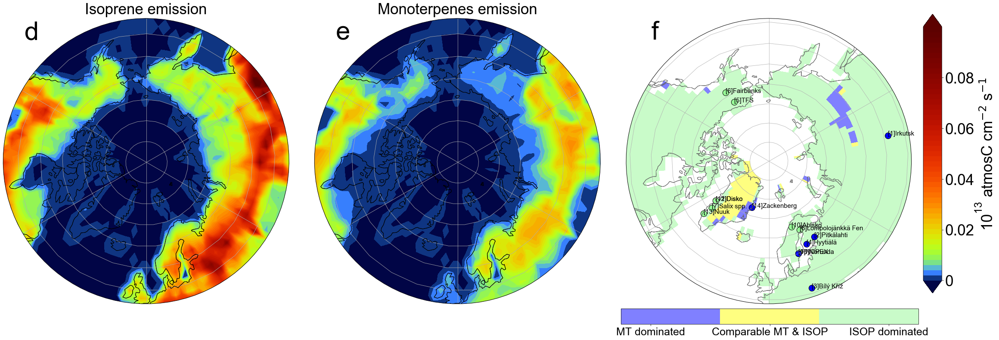

In [42]:
############################################################
#                         Figure 2
############################################################
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter

fig = plt.figure(figsize=[30,10])
    

mon=7
vminmax = [0, 0.1]
levels = np.linspace(vminmax[0], vminmax[1], 50)

#============================================================
#    Plot   GC VCD0  2005-2019 July mean
#============================================================
ax = define_map_3panels(1)

tmp = mm_EmisISOP_Total_05to19_Global
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s( vcd.mean(dim='time') ),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
            cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
ax.text(0.1, 0.95, "d", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, 'Isoprene emission', fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# plot_region()



#============================================================
#    Plot   GC dVCD_Bio  2005-2019 July mean
#============================================================
ax = define_map_3panels(2)

tmp = mm_EmisMTPA_Total_05to19_Global
tmp = add_180_to_lon( tmp )
vcd = tmp[(tmp.time.dt.month==mon)]
im=plt.contourf(vcd.lon, vcd.lat,\
            convert_kg_m2_s_C5H8_to_1e13_atomC_cm2_s(  vcd.mean(dim='time')  ),\
            vmin=vminmax[0] , vmax=vminmax[1], extend='both',\
            transform=ccrs.PlateCarree(),\
#             cmap=cmaps.BlAqGrYeOrReVi200,\
            levels=levels,\
            cmap=cmaps.hotres
                 )
ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3)
ax.gridlines()
# plt.title("OMI reprocess "+str(iyear)+"-07")
# ax.annotate("(e) APIN+BPIN emission", xy=(0.025, 0.98), xycoords="axes fraction",fontsize=42, fontweight='bold')
ax.text(0.1, 0.95, "e", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
# ax.text(0.5, 1.03, r'$\alpha$-pinene + $\beta$-pinene'+" emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')
ax.text(0.5, 1.03, "Monoterpenes emission", fontsize=35, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

# plot_region()


#----------------------------------------------------------------------------------------------------------

fig.tight_layout()#调整整体空白 
plt.subplots_adjust(wspace =0.05, hspace =0.01)#调整子图间距
position=fig.add_axes([1, 0.05, 0.02, 0.9])

cb = plt.colorbar(im,cax=position,\
                 orientation='vertical')

ticks = np.arange(0,0.1,0.02)
formatted_ticks = [f"{tick:.2g}" for tick in ticks]
cb.set_ticks(ticks)
cb.set_ticklabels(formatted_ticks)

# Set the tick labels of the colorbar to use scientific notation
# cb.formatter = ScalarFormatter(useMathText=True)
# cb.formatter.set_powerlimits((0, 0))
# cb.update_ticks()

cb.set_label('10$\mathregular{^{13}}$ atmosC cm$^{-2}$ s$^{-1}$', fontsize=35)
cb.ax.tick_params(labelsize=35)
cb.ax.yaxis.get_offset_text().set_fontsize(35)
# ---------------------------------------------------------------------------------------------------


import matplotlib.colors as mcolors

# Assuming this is your list of data points
data_points = [
    (52.983692, 102.271020, "[1]Irkutsk", 'MONO'),\
    (62.718909, 30.962420, "[2]Pitkälahti", 'MONO'),\
    (49.502145, 18.540182,  "[3]Bílý Kříž", 'MONO'),\
    (61.841381, 24.288974, "[4]Hyytiälä","MONO"),\
    (68.627205, -149.591254, "[5]TFS", 'ISOP'),\
    (64.828813, -147.713703, "[6]Fairbanks", 'ISOP'),\
#     (67.008899, -50.725594, '[7]Kangerlussuaq', 'ISOP'),\
    (67.008899, -50.725594, '[7]Salix spp.', 'ISOP'),\
    (66.607773, 24.057742, '[8]Lompolojänkkä Fen', 'ISOP'),\
    (60.082968, 17.499811, "[9]NOPEX", "ISOP"),\
    (68.350016, 18.816365, '[10]Abisko',  'ISOP'),\
#     (68.355833, 19.045167, '[11]Abisko Stordalen',  '???'),\
    (69.236375, -53.533287, '[11]Disko','MONO'),\
    (69.236375, -53.533287, '[12]Disko','ISOP'),\
    (64.116667, -51.350000, "[13]Nuuk",'ISOP'),\
    (74.500000, -20.500000, '[14]Zackenberg', 'MONO'),\
    (60.083333, 17.483333, '[15]Norunda', 'MONO'),\
#     (60.593833, 7.526833, '[17]Finse', '???')

              ]

# Define a custom colormap
colors = ['blue', 'yellow', 'palegreen']
cmap = mcolors.LinearSegmentedColormap.from_list("", colors)
# Lower the saturation of the colormap
rgb_cmap = cmap(np.arange(cmap.N))
# Convert RGB to HSV
hsv_cmap = mcolors.rgb_to_hsv(rgb_cmap[:, :3])
# Lower the saturation (increase the value in the second column)
hsv_cmap[:, 1] = hsv_cmap[:, 1] * 0.5
# Convert HSV back to RGB
rgb_cmap[:, :3] = mcolors.hsv_to_rgb(hsv_cmap)
# Create the new colormap
cmap = mcolors.LinearSegmentedColormap.from_list("", rgb_cmap)

# only show three colors in colorbar
bounds = [-1, -1/3, 1/3, 1]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Modify the plotting code

ax = define_map_3panels(3)

vcd = BVOCregime_05to19_Global
im = plt.pcolormesh(vcd.lon, vcd.lat, vcd, vmin=-1, vmax=1, transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

ax.set_extent([-180, 180, 47, 90], crs=ccrs.PlateCarree())
ax.coastlines(zorder=3, color='gray')
ax.gridlines()

# Add the data points to the map
for lat, lon, name, domVOC in data_points:
    if domVOC=="MONO":
        fcolor='blue'
    elif domVOC=="ISOP":
        fcolor='palegreen'
    else:
        fcolor='yellow'
    plt.scatter(lon, lat, s=200, edgecolor='black', facecolor=fcolor, transform=ccrs.PlateCarree())
    plt.text(lon, lat, name, fontsize=15, color='black', transform=ccrs.PlateCarree())
ax.text(0.1, 0.95, "f", fontsize=60, fontweight='bold', transform=ax.transAxes, ha='center', va='center')

fig.tight_layout()
plt.subplots_adjust(wspace=0.05, hspace=0.01)
position=fig.add_axes([0.675, -0.05, 0.32, 0.05])
cb = fig.colorbar(im, cax=position, orientation='horizontal', ticks=[-0.8, 0, 0.8])
# position=fig.add_axes([1, 0.05, 0.02, 0.9])
# cb = fig.colorbar(im, cax=position, orientation='vertical', ticks=[-0.66,0,0.66])

# cb.set_label('BVOC regime', fontsize=30)
cb.ax.set_xticklabels(['MT dominated', 'Comparable MT & ISOP', 'ISOP dominated'])
cb.ax.tick_params(labelsize=25)
cb.ax.xaxis.get_offset_text().set_fontsize(25)

# # plt.savefig("BVOCregime.png",dpi=300,bbox_inches='tight')
# plt.show()








plt.savefig('./fig_paper3_HCHOinterannual/Fig4b.png',dpi=300,bbox_inches='tight')

plt.show()

0
1
2
3
4
5
6
7


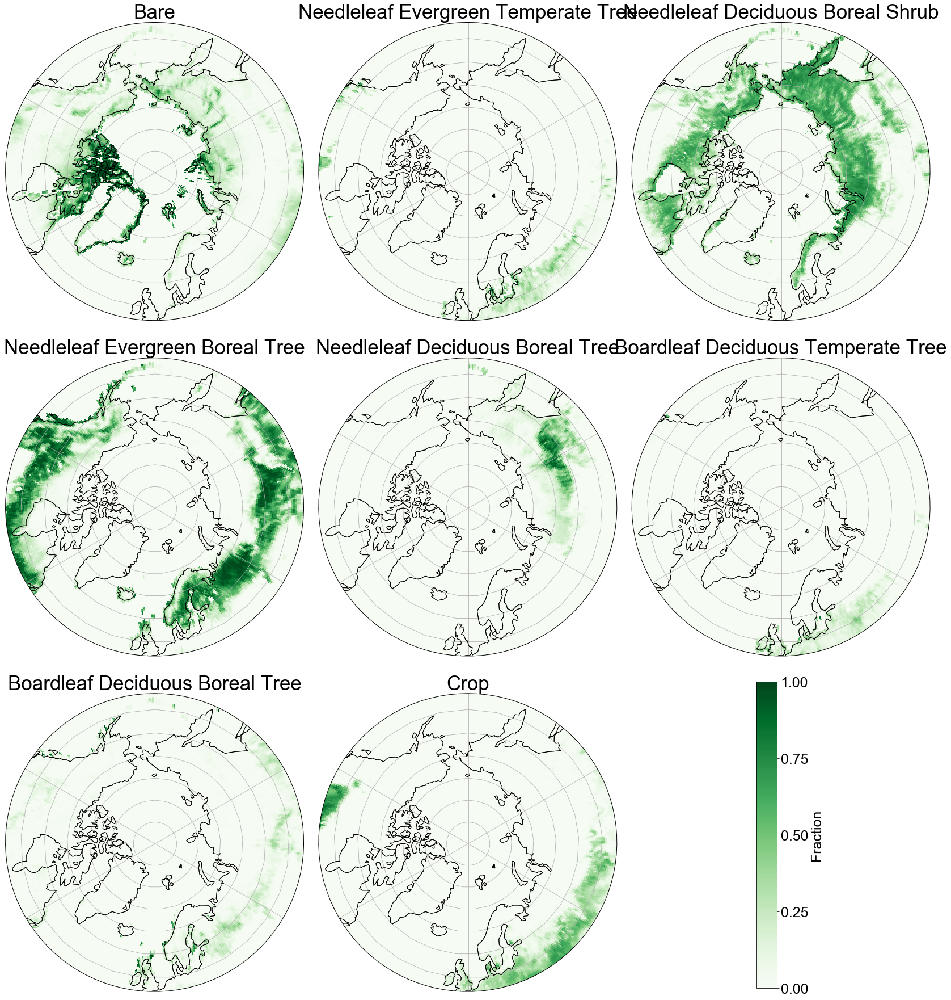

In [48]:
def define_map_ax(ax):
    from matplotlib.path import Path

    ax.coastlines()

    # From example: http://scitools.org.uk/cartopy/docs/latest/examples/always_circular_stereo.html
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)

variables = ["PFT_BARE", "PFT_NDLF_EVGN_TMPT_TREE", "PFT_BDLF_DECD_BORL_SHRB", "PFT_NDLF_EVGN_BORL_TREE", 
             "PFT_NDLF_DECD_BORL_TREE", "PFT_BDLF_DECD_TMPT_TREE", "PFT_BDLF_DECD_BORL_TREE", "PFT_CROP"]
variables_longname = ["Bare", "Needleleaf Evergreen Temperate Tree", "Needleleaf Deciduous Boreal Shrub",\
                      "Needleleaf Evergreen Boreal Tree","Needleleaf Deciduous Boreal Tree", "Boardleaf Deciduous Temperate Tree",\
                      "Boardleaf Deciduous Boreal Tree", "Crop"]


fig = plt.figure(figsize=(25,25))

for i, iPFTname in enumerate(variables):
    print(i)
    ax = fig.add_subplot(3,3,i+1,projection=ccrs.NorthPolarStereo())
    define_map_ax(ax)

    vminmax = [0, 1]

    im = ax.pcolormesh(clmPFT_regrid.lon, clmPFT_regrid.lat,\
                clmPFT_regrid[iPFTname].squeeze() ,\
                vmin=vminmax[0] , vmax=vminmax[1],\
                transform=ccrs.PlateCarree(),\
                cmap=cmaps.MPL_Greens)

    ax.set_extent([-180, 180, 50, 90], crs=ccrs.PlateCarree())
    ax.coastlines(zorder=3)
    ax.gridlines()
    ax.set_title(str(variables_longname[i]))
    
position=fig.add_axes([0.775, 0.02, 0.02, 0.30])
cb = fig.colorbar(im, cax=position, orientation='vertical', ticks=[0,0.25,0.5,0.75,1])
cb.ax.set_ylabel('Fraction',fontsize=25)
cb.ax.tick_params(labelsize=25)
cb.ax.xaxis.get_offset_text().set_fontsize(25)


plt.tight_layout()
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.savefig('./fig_paper3_HCHOinterannual/FigS1.png',dpi=300,bbox_inches='tight')
plt.show()

